## Initial Analysis of Gulf Stream Cruise Data from Sept Cruise (Sept 4-9)

In [1]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs

import pandas as pd
import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime

In [1]:
data_src='data/'

In [2]:
# chla_abs_df = pd.read_csv('data/bricaud_1995_aph.txt')
# fig, ax = plt.subplots(2, figsize=(9,8))
# chla_abs_df.plot('lambda', 'A', ax=ax[0])
# chla_abs_df.plot('lambda', 'B', ax=ax[1])

#### Pull in CDOM data and ship TSG/GPS data

In [3]:
path = data_src+'wscd859/' # use your path
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df_tmp = pd.read_csv(filename, index_col=None, header=1)
    li.append(df_tmp)
cdom_df = pd.concat(li, axis=0, ignore_index=True)

cdom_df['utc_dt'] = pd.to_datetime(cdom_df['yyyy/mm/dd HH:MM:SS.fff'])

cdom_df = cdom_df.set_index('utc_dt')

df = pd.read_csv(data_src+"SW21011R_RFP/EventData/DataLogger/Data every 1 min_001.elg")
df.head()

,Date,Time,SW-ZDA-Year,SW-ZDA-Month,SW-ZDA-Day,SW-ZDA-Time,SW-GGA-Lat,SW-GGA-NorS,SW-GGA-Long,SW-GGA-EorW,...,SW-Weather-HumidRel-%,SW-Wind-WindSpeedRel,SW-Wind-WindAngleRel,TrueWind-DRV-SPEED,TrueWind-DRV-DIRECTION,TSG--temp-SBE38,TSG--sal,SW-Depth-DBT-Depth below transducer (m),DepthOverall-DRV-VALUE,Unnamed: 24
0,09/04/2021,22:57:59,2021,9,4,230119.69,3438.0721,N,7639.5131,W,...,62.1,23.70,346.29,3.65,137.98,26.5469,36.0464,15.57,16.57,NaN
1,09/04/2021,22:58:59,2021,9,4,230220.00,3437.7653,N,7639.3397,W,...,62.6,23.70,347.29,0.92,120.30,26.5202,35.9130,16.51,17.51,NaN
2,09/04/2021,22:59:59,2021,9,4,230319.70,3437.4662,N,7639.1743,W,...,62.0,19.98,344.39,1.74,100.41,26.7050,35.9890,16.34,17.34,NaN
3,09/04/2021,23:00:59,2021,9,4,230420.70,3437.1706,N,7639.0156,W,...,63.8,23.09,346.09,4.72,123.35,26.7135,36.0296,16.23,17.23,NaN
4,09/04/2021,23:01:59,2021,9,4,230520.70,3436.8780,N,7638.8561,W,...,63.5,23.38,348.79,4.31,152.50,26.8741,36.0758,16.52,17.52,NaN


In [4]:
# This first one is the right way to do this

In [5]:
# date_time_strs = df['SW-ZDA-Year'].astype('str') + ' ' + df['SW-ZDA-Month'].astype('str') + ' ' + df['SW-ZDA-Day'].astype('str') + ' ' + df['SW-ZDA-Time'].astype('str').str[:-2].str.replace('.','')

# df['datetime'] = [datetime.strptime(x, '%Y %m %d %H%M%S') for x in date_time_strs]
# df['utc_dt'] = df['datetime']
# df  = df.set_index('utc_dt')

In [6]:
date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')

In [7]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

<AxesSubplot:>

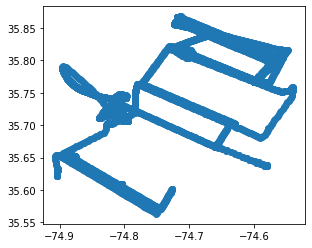

In [8]:
import geopandas as gpd

gdf = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat))
gdf.loc['2021-09-5 11:00:00':'2021-09-8 20:45:00'].plot()

In [9]:
nav_df = pd.read_csv(data_src+'SW21011R_RFP/Navigation/SW-GGA_20210904-222337.Raw',  names=['Date', 'Time', 'GPGGA','Unknown', 'SW-GGA-Lat', 'latdir', 'SW-GGA-Long', 'londir', '1', '2', '3', '4', '5', '6', '7'])

def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

nav_df['lon'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
nav_df['lat'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

In [10]:
date_time_strs = nav_df['Date'] + ' ' + nav_df['Time']

nav_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S.%f') for x in date_time_strs]

In [11]:
nav_df['utc_dt'] = nav_df['datetime']
nav_df  = nav_df.set_index('utc_dt')

In [12]:
nav_df.head(2)

,Date,Time,GPGGA,Unknown,SW-GGA-Lat,latdir,SW-GGA-Long,londir,1,2,3,4,5,6,7,lon,lat,datetime
utc_dt,,,,,,,,,,,,,,,,,,
2021-09-04 22:23:39.384,09/04/2021,22:23:39.384,$GPGGA,222708.68,3443.0545,N,7640.2335,W,2,26,0.5,-28.8,M,-36.8,M*46,-76.670558,34.717575,2021-09-04 22:23:39.384
2021-09-04 22:23:40.340,09/04/2021,22:23:40.340,$GPGGA,222709.67,3443.0545,N,7640.2335,W,2,26,0.5,-28.8,M,-36.8,M*48,-76.670558,34.717575,2021-09-04 22:23:40.340


In [13]:
tsg_df = pd.read_csv(data_src+'SW21011R_RFP/TSG/TSG-_20210904-222337.Raw', names=['DateTime', 'Temp','Sal','Unknown'], delim_whitespace=True)#sep=r"s*")# names=['Date', 'Time', 'Data'])
tsg_df

,DateTime,Temp,Sal,Unknown
0,"09/04/2021,22:57:51.709,",26.5469,36.0464,1539.56
1,"09/04/2021,22:58:01.635,",26.5226,36.0374,1539.49
2,"09/04/2021,22:58:11.623,",26.4849,36.0074,1539.38
3,"09/04/2021,22:58:21.627,",26.4642,35.9757,1539.30
4,"09/04/2021,22:58:31.627,",26.4588,35.9478,1539.25
...,...,...,...,...
39254,"09/09/2021,12:00:14.732,",27.4096,35.8314,1541.24
39255,"09/09/2021,12:00:24.733,",27.4104,35.8320,1541.24
39256,"09/09/2021,12:00:34.724,",27.4130,35.8316,1541.24
39257,"09/09/2021,12:00:44.717,",27.4145,35.8318,1541.25


In [14]:
tsg_df['datetime'] = [datetime.strptime(x[:-1], '%m/%d/%Y,%H:%M:%S.%f') for x in tsg_df.DateTime]

In [15]:
tsg_df['utc_dt'] = tsg_df['datetime']
tsg_df  = tsg_df.set_index('utc_dt')

In [16]:
lats = []
lons = []
for i in range(len(tsg_df)):
    row = nav_df.iloc[nav_df.index.get_loc(tsg_df.iloc[i].datetime, method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
tsg_df['lat'] = lats
tsg_df['lon'] = lons

In [17]:
tsg_df

,DateTime,Temp,Sal,Unknown,datetime,lat,lon
utc_dt,,,,,,,
2021-09-04 22:57:51.709,"09/04/2021,22:57:51.709,",26.5469,36.0464,1539.56,2021-09-04 22:57:51.709,34.635135,-76.658900
2021-09-04 22:58:01.635,"09/04/2021,22:58:01.635,",26.5226,36.0374,1539.49,2021-09-04 22:58:01.635,34.634277,-76.658408
2021-09-04 22:58:11.623,"09/04/2021,22:58:11.623,",26.4849,36.0074,1539.38,2021-09-04 22:58:11.623,34.633410,-76.657933
2021-09-04 22:58:21.627,"09/04/2021,22:58:21.627,",26.4642,35.9757,1539.30,2021-09-04 22:58:21.627,34.632555,-76.657438
2021-09-04 22:58:31.627,"09/04/2021,22:58:31.627,",26.4588,35.9478,1539.25,2021-09-04 22:58:31.627,34.631783,-76.657000
...,...,...,...,...,...,...,...
2021-09-09 12:00:14.732,"09/09/2021,12:00:14.732,",27.4096,35.8314,1541.24,2021-09-09 12:00:14.732,34.713177,-76.678337
2021-09-09 12:00:24.733,"09/09/2021,12:00:24.733,",27.4104,35.8320,1541.24,2021-09-09 12:00:24.733,34.713415,-76.677847
2021-09-09 12:00:34.724,"09/09/2021,12:00:34.724,",27.4130,35.8316,1541.24,2021-09-09 12:00:34.724,34.713595,-76.677397


In [18]:
# tsg_df = tsg_df.drop('Unknown', 1)
# tsg_df = tsg_df.drop('DateTime', 1)
# tsg_df.to_csv('sept_4_9_ship_data_geolocated.csv')

In [19]:
tsg_gdf = gpd.GeoDataFrame(tsg_df, geometry=gpd.points_from_xy(tsg_df.lon, tsg_df.lat))

<AxesSubplot:>

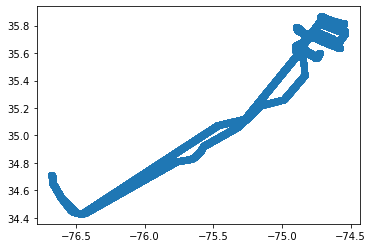

In [20]:
tsg_gdf.plot()

### Pull in FCM Data

In [21]:
fcm_df = pd.read_csv(data_src+'SW_fcm_full_bac_chla.csv')

In [22]:
fcm_df

,Sample#,Time (UTC),Date,Syn/mL,SynA,SynB,Syn_Avg,Peuks/mL,PeuksA,PeaksB,Peuks_Avg,PicoCyano/mL,PicoCyanoA,PicoCyanoB,PicoCyano_Avg,Bacteria_A,Bacteria_B,Chla A,Chla B,Chla_Avg
0,1,12:07,9/5/2021,1,97072.84768,89405.94059,93239.39414,1,2781.456954,2257.425743,2519.441348,1,101960.26490,89504.95050,95732.60770,1040000.0,1020000.0,0.2342,0.2247,0.22945
1,2,13:02,9/5/2021,2,85009.90099,79108.91089,82059.40594,2,2455.445545,2059.405941,2257.425743,2,79881.18812,76316.83168,78099.00990,916000.0,951000.0,0.2092,0.2232,0.21620
2,3,13:48,9/5/2021,3,76435.64356,81603.96040,79019.80198,3,2396.039604,2475.247525,2435.643564,3,71841.58416,70930.69307,71386.13861,926000.0,857000.0,0.2172,0.2477,0.23245
3,4,14:08,9/5/2021,4,90534.65347,69009.90099,79772.27723,4,2594.059406,1821.782178,2207.920792,4,84396.03960,70950.49505,77673.26733,918000.0,860000.0,0.2397,0.2092,0.22445
4,5,14:16,9/5/2021,5,83089.10891,50019.80198,66554.45545,5,2257.425743,1564.356436,1910.891089,5,91405.94059,49663.36634,70534.65347,924000.0,905000.0,0.2377,0.2267,0.23220
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,82,14:46,9/7/2021,82,18910.89109,19748.34437,19329.61773,82,1445.544554,1052.980132,1249.262343,82,106178.21780,100033.11260,103105.66520,628000.0,626000.0,-999.0000,-999.0000,-999.00000
82,83,14:52,9/7/2021,83,21544.55446,20165.56291,20855.05868,83,1188.118812,1450.331126,1319.224969,83,98693.06931,99019.86755,98856.46843,636000.0,652000.0,-999.0000,-999.0000,-999.00000
83,84,15:07,9/7/2021,84,35366.33663,32304.63576,33835.48620,84,1663.366337,1152.317881,1407.842109,84,91326.73267,79649.00662,85487.86965,790000.0,798000.0,-999.0000,-999.0000,-999.00000
84,85,15:10,9/7/2021,85,38871.28713,41543.04636,40207.16674,85,1782.178218,1390.728477,1586.453347,85,87108.91089,78397.35099,82753.13094,734000.0,771000.0,-999.0000,-999.0000,-999.00000


In [23]:
date_time_strs = fcm_df['Date'] + ' ' + fcm_df['Time (UTC)']

fcm_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M') for x in date_time_strs]

In [24]:
fcm_df['utc_dt'] = fcm_df['datetime']
fcm_df  = fcm_df.set_index('utc_dt')

In [25]:
fcm_df.head()

,Sample#,Time (UTC),Date,Syn/mL,SynA,SynB,Syn_Avg,Peuks/mL,PeuksA,PeaksB,...,PicoCyano/mL,PicoCyanoA,PicoCyanoB,PicoCyano_Avg,Bacteria_A,Bacteria_B,Chla A,Chla B,Chla_Avg,datetime
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-09-05 12:07:00,1,12:07,9/5/2021,1,97072.84768,89405.94059,93239.39414,1,2781.456954,2257.425743,...,1,101960.26490,89504.95050,95732.60770,1040000.0,1020000.0,0.2342,0.2247,0.22945,2021-09-05 12:07:00
2021-09-05 13:02:00,2,13:02,9/5/2021,2,85009.90099,79108.91089,82059.40594,2,2455.445545,2059.405941,...,2,79881.18812,76316.83168,78099.00990,916000.0,951000.0,0.2092,0.2232,0.21620,2021-09-05 13:02:00
2021-09-05 13:48:00,3,13:48,9/5/2021,3,76435.64356,81603.96040,79019.80198,3,2396.039604,2475.247525,...,3,71841.58416,70930.69307,71386.13861,926000.0,857000.0,0.2172,0.2477,0.23245,2021-09-05 13:48:00
2021-09-05 14:08:00,4,14:08,9/5/2021,4,90534.65347,69009.90099,79772.27723,4,2594.059406,1821.782178,...,4,84396.03960,70950.49505,77673.26733,918000.0,860000.0,0.2397,0.2092,0.22445,2021-09-05 14:08:00
2021-09-05 14:16:00,5,14:16,9/5/2021,5,83089.10891,50019.80198,66554.45545,5,2257.425743,1564.356436,...,5,91405.94059,49663.36634,70534.65347,924000.0,905000.0,0.2377,0.2267,0.23220,2021-09-05 14:16:00


In [26]:
lats = []
lons = []
for i in range(len(fcm_df)):
    row = df.iloc[df.index.get_loc(pd.to_datetime(fcm_df.iloc[i].datetime), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
fcm_df['lat'] = lats
fcm_df['lon'] = lons

In [27]:
# fcm_df[['Sample#', 'datetime', 'lat', 'lon']].to_csv('sept_4_9_sample_time_loc.csv')

In [28]:
fcm_gdf = gpd.GeoDataFrame(fcm_df, geometry=gpd.points_from_xy(fcm_df.lon, fcm_df.lat))

In [29]:
fcm_gdf.columns

Index(['Sample#', 'Time (UTC)', 'Date', 'Syn/mL', 'SynA', 'SynB', 'Syn_Avg',
       'Peuks/mL', 'PeuksA', 'PeaksB', 'Peuks_Avg', 'PicoCyano/mL',
       'PicoCyanoA', 'PicoCyanoB', 'PicoCyano_Avg', 'Bacteria_A', 'Bacteria_B',
       'Chla A', 'Chla B', 'Chla_Avg', 'datetime', 'lat', 'lon', 'geometry'],
      dtype='object')

In [30]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']


<AxesSubplot:>

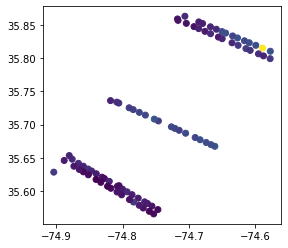

In [31]:
fcm_gdf.plot(column='PicoCyano_Avg')

### Pull in Profiles

In [1]:
import scipy.io
names = ['transect_0','transect_1', 'transect_2', 'transect_5', 'transect_6', 'transect_9']
li = []
for i, fn in enumerate([data_src+'VMP/VMPsurvey_051_corrected.mat', data_src+'VMP/VMPsurvey_052.mat', data_src+'VMP/VMPsurvey_053.mat', data_src+'VMP/VMPsurvey_056.mat',
                       data_src+'VMP/VMPsurvey_057.mat', data_src+'VMP/VMPsurvey_059.mat']):
    mat = scipy.io.loadmat(fn)
    for item in list(mat.keys()):
        if item not in ['__header__', '__version__', '__globals__']:
            df_tmp = pd.DataFrame(data=mat[item], columns=['time', 'depth (dBars)', 'temp (C)','salinity (PSU)', 'potential density (kg/m^3 -1000)', 
                                                    'chla (ppb)', 'turbidity (FTU)', 'turb kinetic energy 1 (W/kg)', 'turb kinetic energy 2 (W/kg)'])
            df_tmp['transect'] = names[i]
            df_tmp['profile_num'] = int(item.split('profile')[-1])
            li.append(df_tmp)

profiles = pd.concat(li, axis=0, ignore_index=True)
profiles['dt'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(profiles.time, unit='D') - pd.Timedelta(days=1)
profiles = profiles.set_index('dt')
profiles = profiles.sort_index(ascending=True)
profiles['datetime'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(profiles.time, unit='D') - pd.Timedelta(days=1)

NameError: name 'pd' is not defined

In [70]:
profiles.head()

,time,depth (dBars),temp (C),salinity (PSU),potential density (kg/m^3 -1000),chla (ppb),turbidity (FTU),turb kinetic energy 1 (W/kg),turb kinetic energy 2 (W/kg),transect,profile_num,datetime
dt,,,,,,,,,,,,
2021-09-05 13:52:21.803404800,248.578030,-1.717033,27.119445,34.526403,22.325158,-0.164738,1.036380,7.991667e-03,9.616664e-05,transect_0,1,2021-09-05 13:52:21.803404800
2021-09-05 13:52:23.303308800,248.578047,-2.808599,27.110735,34.527139,22.328575,-0.153261,1.042019,8.094077e-09,1.029868e-08,transect_0,1,2021-09-05 13:52:23.303308800
2021-09-05 13:52:24.803126400,248.578065,-3.978744,27.107661,34.528272,22.330496,-0.157631,1.048239,5.479929e-09,9.837255e-09,transect_0,1,2021-09-05 13:52:24.803126400
2021-09-05 13:52:26.303030400,248.578082,-5.221888,27.105981,34.532459,22.334277,-0.147476,1.053390,1.574854e-08,1.337033e-08,transect_0,1,2021-09-05 13:52:26.303030400
2021-09-05 13:52:27.802934400,248.578100,-6.566552,27.105881,34.540254,22.340276,-0.149410,1.048760,9.117314e-09,4.515477e-09,transect_0,1,2021-09-05 13:52:27.802934400


In [71]:
def profile_locs(df):
    # add in lat and lon
    lats = []
    lons = []
    for i in range(len(df)):
        row = tsg_df.iloc[tsg_df.index.get_loc(pd.to_datetime(df.iloc[i].datetime), method='nearest')]
        lats.append(row.lat)
        lons.append(row.lon)

    df['lat'] = lats
    df['lon'] = lons

    # now make it the same for each profile depending on the first row with that profile_num
    current_prof_num = df.profile_num.min()
    lats = []
    lons = []
    for row in df.itertuples(index=False):
        if row.profile_num == current_prof_num:
            top_lat = row.lat
            top_lon = row.lon
            current_prof_num+=1
        lats.append(top_lat)
        lons.append(top_lon)

    df['lat'] = lats
    df['lon'] = lons
    return(df)

Define the interpolation function

In [72]:
import matplotlib.colors as mat_colors

In [73]:
import numpy as np
# from scipy.interpolate import interp2d
import scipy


data_variables = ['temp (C)', 'salinity (PSU)',
       'potential density (kg/m^3 -1000)', 'chla (ppb)', 'turbidity (FTU)',
       'turb kinetic energy 1 (W/kg)', 'turb kinetic energy 2 (W/kg)']

def interpolate_profiles(df, transect, data_variables, plot=False):
    df_subset = df[df.transect == transect]
    interpolated_grids = []
    datetime_list = []
    for i in np.unique(df_subset.profile_num.values):
        datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
    datetime_list = np.array(datetime_list)
    datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
    
    # Original data (e.g. measurements)
    for data_var in data_variables:
#         x_interp = np.arange(1,len(datetime_list), 1)
#         y_interp = np.arange(-1,-115, -1)

#         xx, yy = np.meshgrid(x_interp, y_interp)
#         Z_table = df_subset[data_var].values

#         Z = scipy.interpolate.griddata(np.array(list(zip(df_subset.profile_num.values , df_subset['depth (dBars)'].values ))), Z_table, (xx, yy), method='linear')

        datetime_list = []
        for i in np.unique(df_subset.profile_num.values):
            datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
        datetime_list = np.array(datetime_list)
        datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
        
#         interpolated_grids.append(Z)

        if plot:
            norm=None
            fig, ax = plt.subplots(figsize=(8,7))
            if data_var == 'temp (C)':
                vmin=25
                vmax=28.5
            elif data_var == 'salinity (PSU)':
                vmin=33.5
                vmax=36.5
            elif data_var == 'potential density (kg/m^3 -1000)':
                vmin=22
                vmax=26.3
            elif data_var == 'chla (ppb)':
                vmin=-0.3
                vmax=0.5
            elif data_var == 'turbidity (FTU)':
                vmin=1
                vmax=1.12
            elif data_var == 'turb kinetic energy 1 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=mat_colors.LogNorm()
            elif data_var == 'turb kinetic energy 2 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=mat_colors.LogNorm()
            
                
            sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap='RdYlBu_r', s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)
            cb = fig.colorbar(sc)
            ax.set_ylim(-120,0)

            cb.set_label(data_var)
            ax.set_ylabel('Depth (m')
            ax.set_xlabel('Time (UTC)')
        #     ax[1].xaxis.set_major_locator(plt.MaxNLocator(7))
            fig.autofmt_xdate(rotation=45)
#             ax.xaxis.set_major_locator(plt.MaxNLocator(15))

            fig.savefig('figs/sept_'+transect+'_profile_'+data_var[:20]+'.png')
            plt.show()
#     return(datetime_list, interpolated_grids)

In [85]:
from geopy import distance

def get_dist(df, df_start, flip=False):
    distances = []
    # flip allows you to swap the starting side so that it can always do dist from the same side
    if flip == False:
        first_row = df_start.iloc[0]
    else:
        first_row = df_start.iloc[-1]
    for row in df.itertuples(index=False):
        distances.append(distance.distance((row.lat, row.lon),(first_row.lat,first_row.lon)).meters)
    return(distances)

In [86]:
! pip install colour

In [ ]:
# CTD times:

Sep 05 2021 13:15:33 [System UTC, header]
Sep 05 2021 15:21:30 [System UTC, header]
Sep 05 2021 17:14:42 [System UTC, header]
Sep 06 2021 15:55:49 [System UTC, header]
Sep 06 2021 19:43:26 [System UTC, header]
Sep 07 2021 15:20:56 [System UTC, header]
Sep 07 2021 11:27:29 [System UTC, header]

In [115]:
from colour import Color
def plot_profiles(df, start_time, end_time, data_variables, transect, plot=False):
    print('##############################')
    print('Transect ' + str(i+1))
    print('##############################')
    df_subset = df.loc[start_time:end_time]
    
    df_subset = profile_locs(df_subset)
    
    # Original data (e.g. measurements)
    for data_var in data_variables:
        if plot:
            cmap='RdYlBu_r'
            norm=None
            fig, ax = plt.subplots(figsize=(17.2,7))
            if data_var == 'temp (C)':
                cmap='inferno'
                vmin=26
                vmax=29.5
            elif data_var == 'salinity (PSU)':
                vmin=35
                vmax=36.2
            elif data_var == 'potential density (kg/m^3 -1000)':
                vmin=22.5
                vmax=23.5
            elif data_var == 'chla (ppb)':
                vmin=-0.3
                vmax=0.5
                cmap='viridis'
            elif data_var == 'turbidity (FTU)':
                vmin=1
                vmax=1.12
            elif data_var == 'turb kinetic energy 1 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=mat_colors.LogNorm()
            elif data_var == 'turb kinetic energy 2 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=mat_colors.LogNorm()
                
            flip=False
            if transect in [1,8]:
                flip=True
            
            df_subset_distances = get_dist(df_subset, tsg_df.loc[start_times[i]:end_times[i]], flip=flip)
            sc = ax.scatter(df_subset_distances, df_subset['depth (dBars)'],c=df_subset[data_var],cmap=cmap, s=150, alpha=.7, vmin=vmin,vmax=vmax, norm=norm)
            
#             if transect==0:
                
#                 Sep 05 2021 13:15:33 [System UTC, header]
#                 Sep 05 2021 15:21:30 [System UTC, header]
#                 Sep 05 2021 17:14:42 [System UTC, header]
                        
                
#                 if data_var == 'temp (C)':
#                     for t_string in ['Sep 05 2021 13:15:33']:
#                         df_idx = df_subset.index.get_loc(pd.to_datetime('Sep 05 2021 13:15:33'), method='nearest')
#                         ax.scatter(df_subset_distances, df_subset['depth (dBars)'],c=df_subset[data_var]
            
#             sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap=cmap, s=150, alpha=.7, vmin=vmin,vmax=vmax, norm=norm)
            ax.set_ylim(-70,0)
#             ax.set_xlim(df_subset['datetime'].max()+timedelta(hours=.1),df_subset['datetime'].min()-timedelta(hours=.1))
            cb = fig.colorbar(sc)
            cb.set_label(data_var)
            
#             depths = [-5,-10,-20,-30,-60]
        
#             colors = list(Color("black").range_to(Color("blue"),len(depths)))
#             hex_colors = [j.hex for j in colors]
#             # integrate down to z depth
#             ax2 = ax.twinx()
#             for idx,z in enumerate(depths):
#                 # cut it off at depth (dBars) >= z
#                 df_tmp = df_subset[df_subset['depth (dBars)'] >= z] 
#                 df_tmp_grouped = df_tmp.groupby('profile_num').mean()
#                 df_tmp_grouped['datetime'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(df_tmp_grouped.time, unit='D') - pd.Timedelta(days=1)


#                 ax2.plot(df_tmp_grouped['datetime'],df_tmp_grouped[data_var], label=str(z), color=hex_colors[idx])
#                 ax2.set_ylim(vmin,vmax)
#                 ax2.legend(loc='lower left',title='Depth Integrated Values')
            
            
        
            ax.set_ylabel('Depth (m')
            ax.set_xlabel('Distance (m)')
#             ax.set_xlim(pd.to_datetime(start_time), pd.to_datetime(end_time))
#             ax.set_xlim(pd.to_datetime(end_time),pd.to_datetime(start_time))
        #     ax[1].xaxis.set_major_locator(plt.MaxNLocator(7))
            fig.autofmt_xdate(rotation=45)
#             ax.xaxis.set_major_locator(plt.MaxNLocator(15))
#             print(data_var[:20]+'.png')
            fig.savefig('figs/sept_transect_'+str(transect+1)+'_'+data_var[:20]+'.png')
            plt.show()

In [116]:
data_variables

['temp (C)',
 'salinity (PSU)',
 'potential density (kg/m^3 -1000)',
 'chla (ppb)',
 'turbidity (FTU)',
 'turb kinetic energy 1 (W/kg)',
 'turb kinetic energy 2 (W/kg)']

In [117]:
plt.rcParams.update({'font.size': 14})

In [118]:
i=0

In [119]:
start_times

['2021-09-5 13:00:00',
 '2021-09-5 18:15:00',
 '2021-09-6 1:00:00',
 '2021-09-6 5:10:00',
 '2021-09-6 12:30:00',
 '2021-09-6 16:45:00',
 '2021-09-7 2:55:00',
 '2021-09-7 6:45:00',
 '2021-09-7 12:10:00']

In [120]:
profiles.iloc[i].datetime

Timestamp('2021-09-05 13:52:21.803404800')

##############################
Transect 1
##############################


<ipython-input-71-86412cf277c2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lat'] = lats
<ipython-input-71-86412cf277c2>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lon'] = lons
<ipython-input-71-86412cf277c2>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-vers

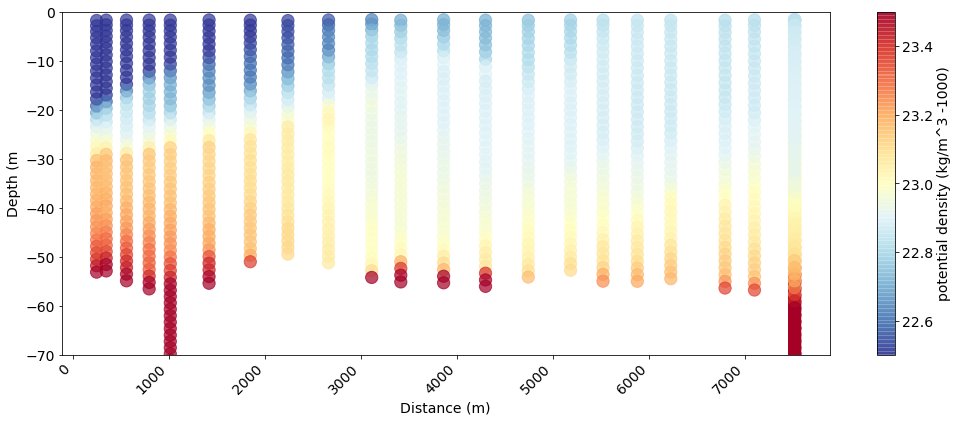

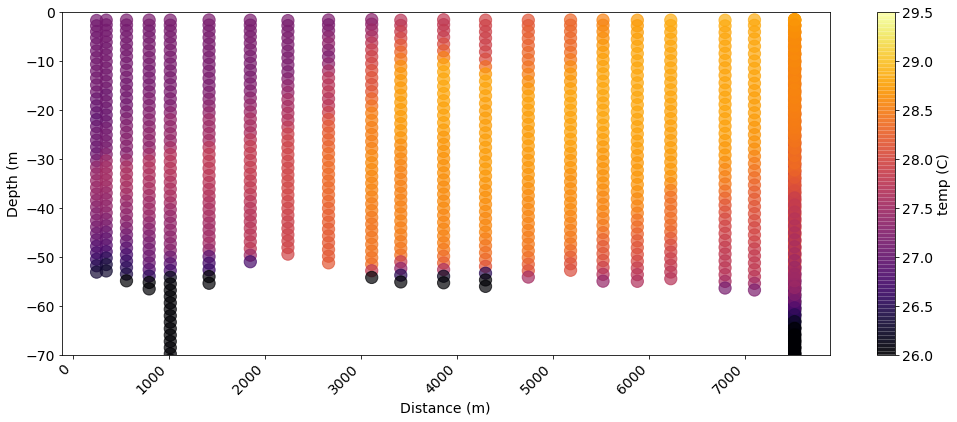

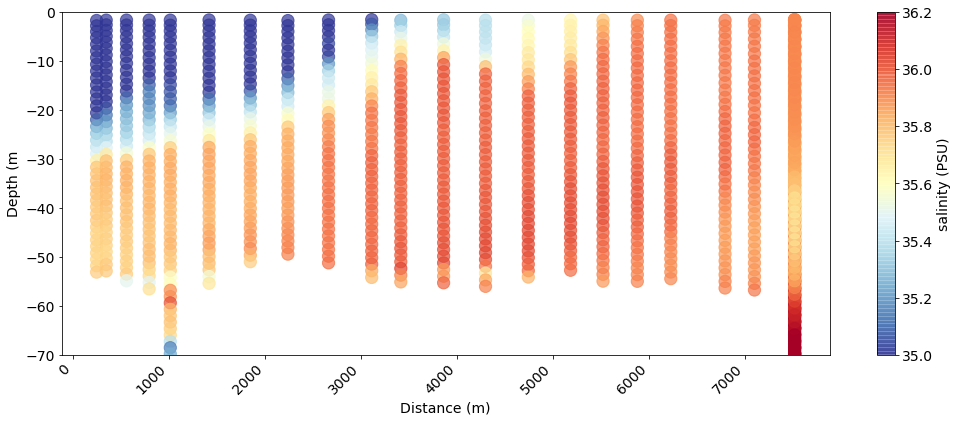

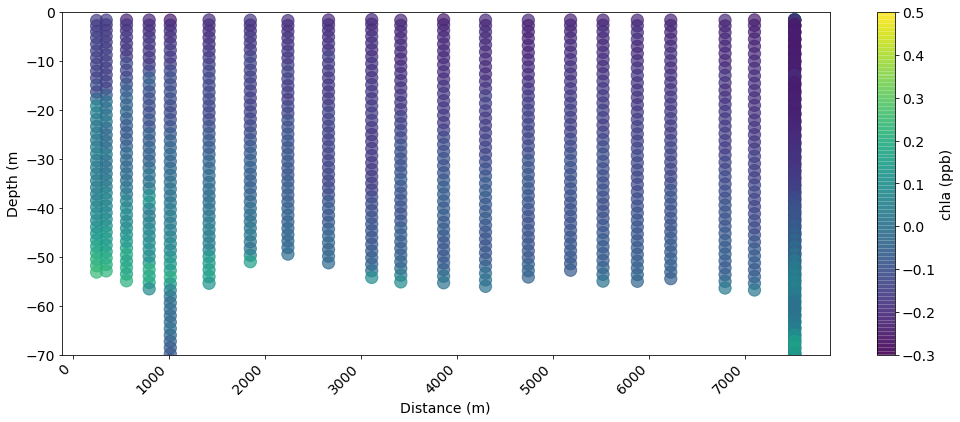

##############################
Transect 2
##############################


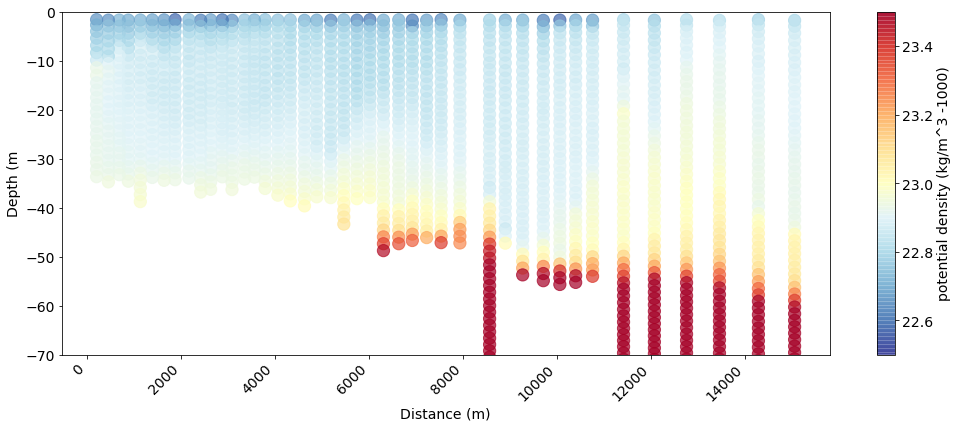

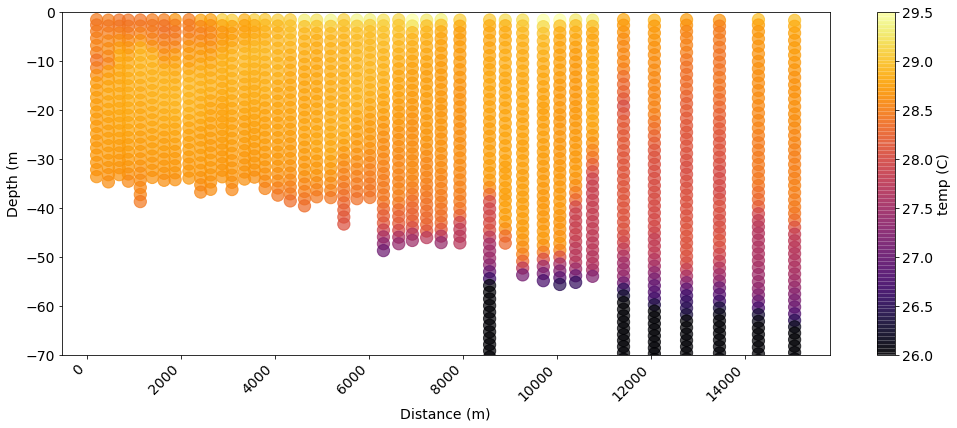

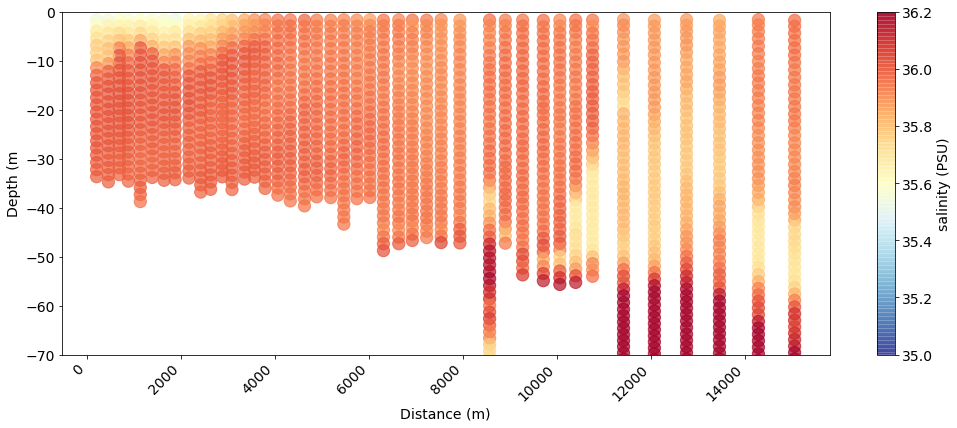

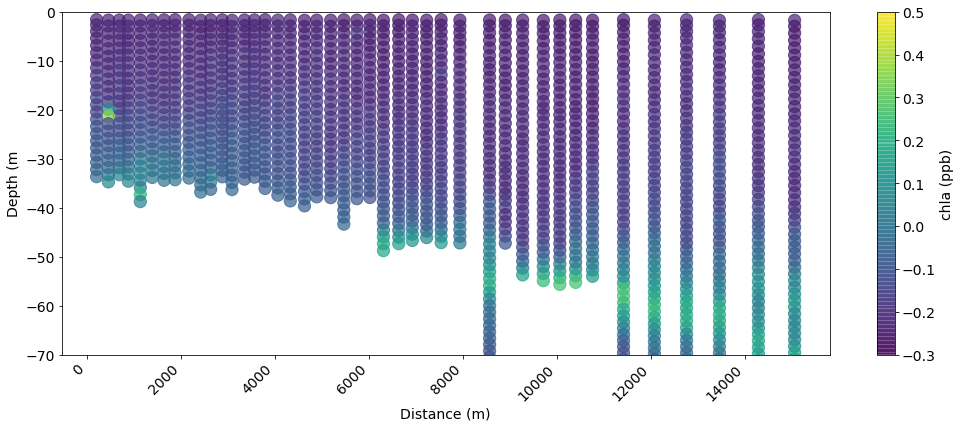

##############################
Transect 5
##############################


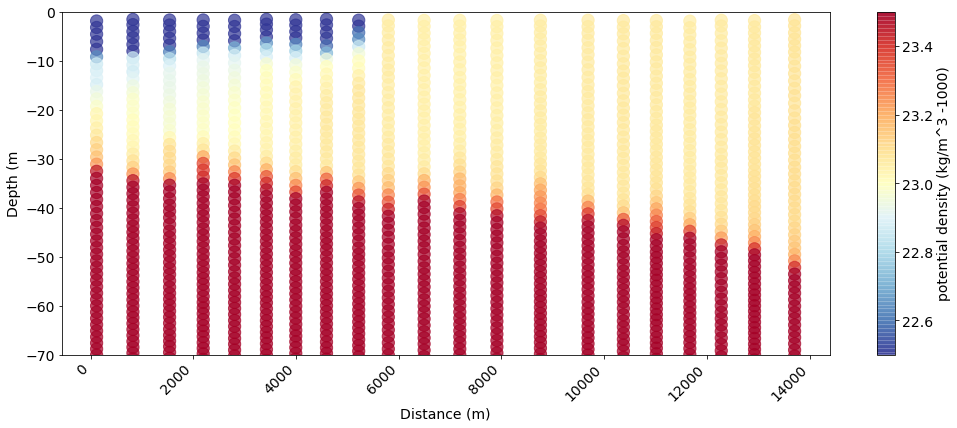

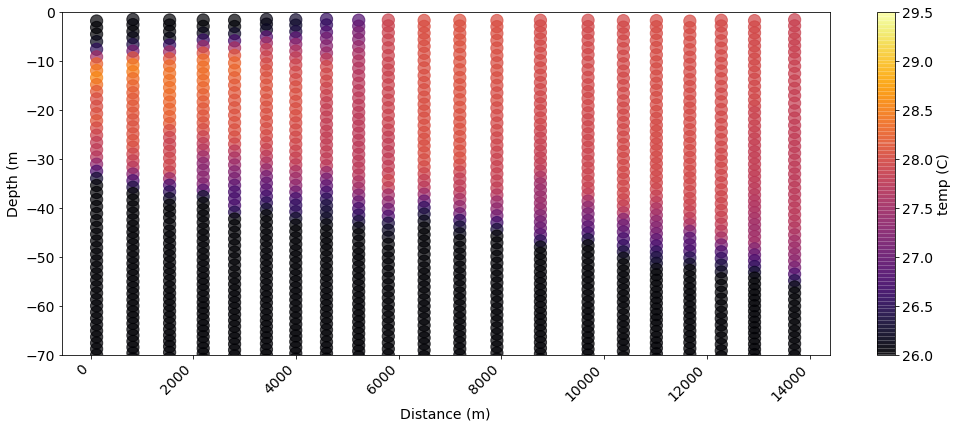

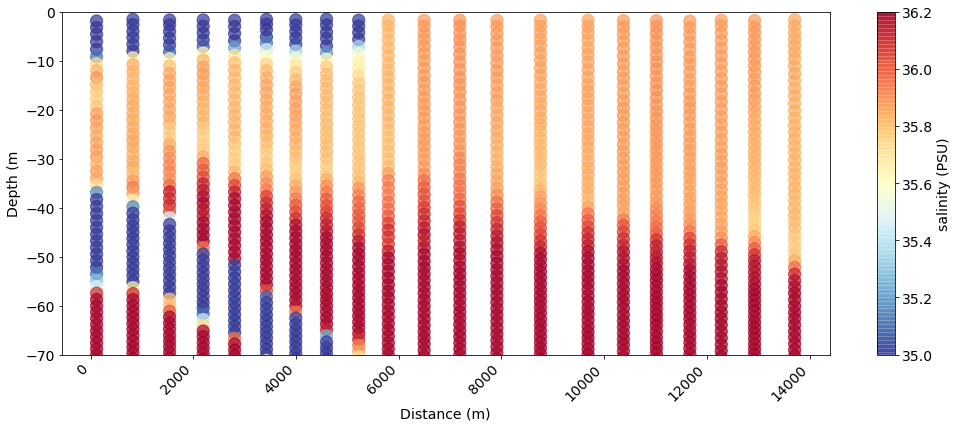

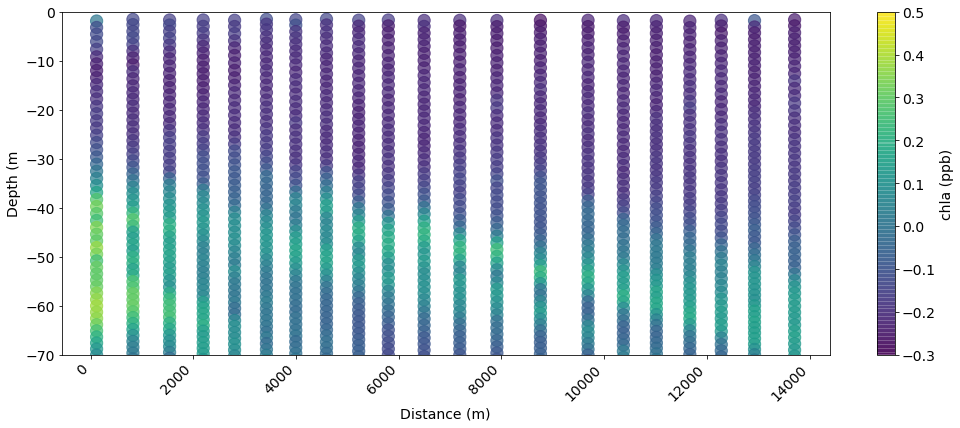

##############################
Transect 6
##############################


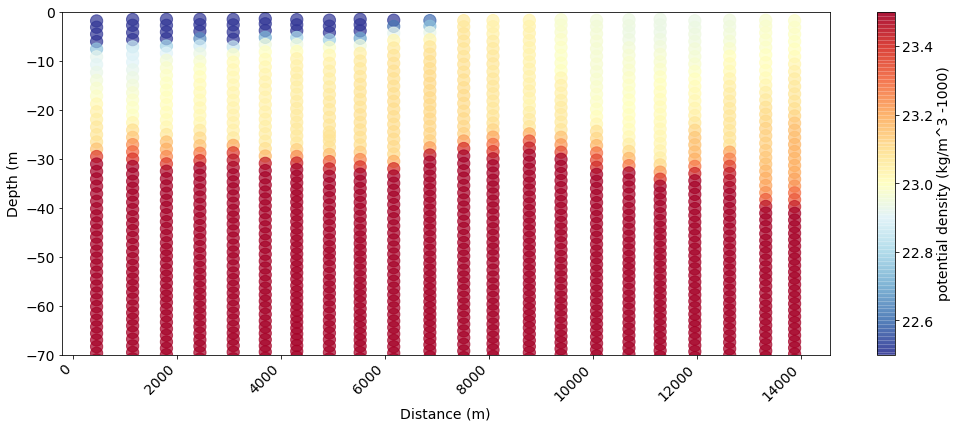

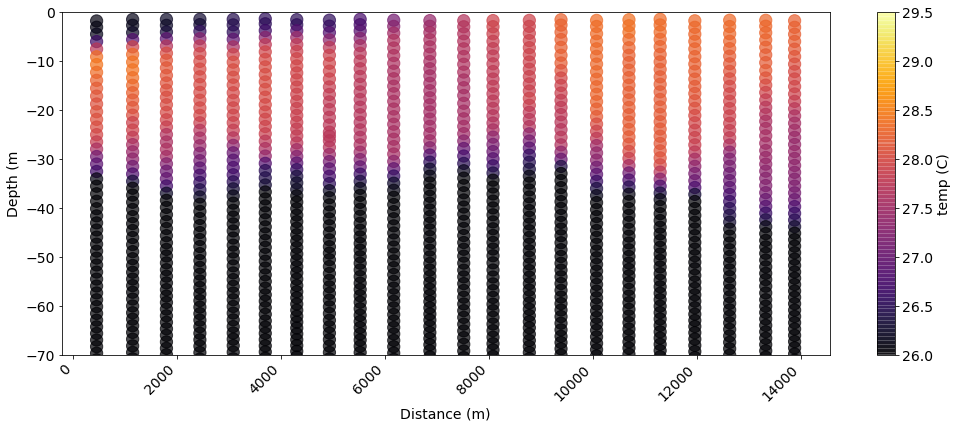

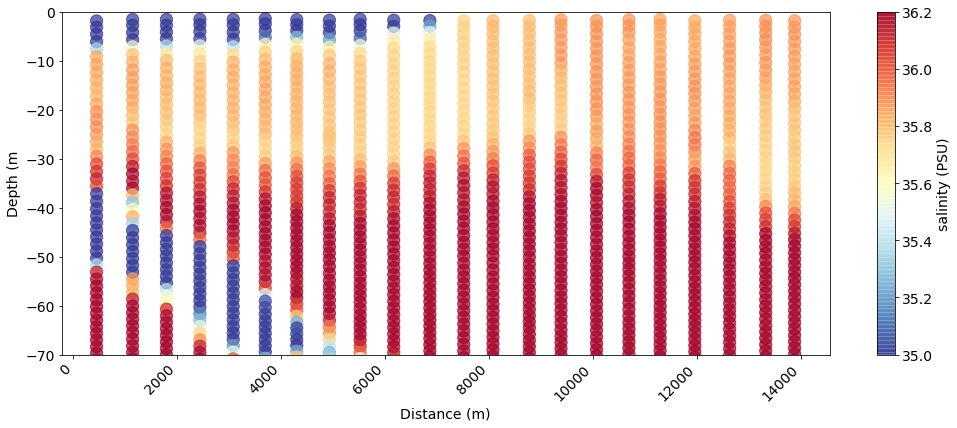

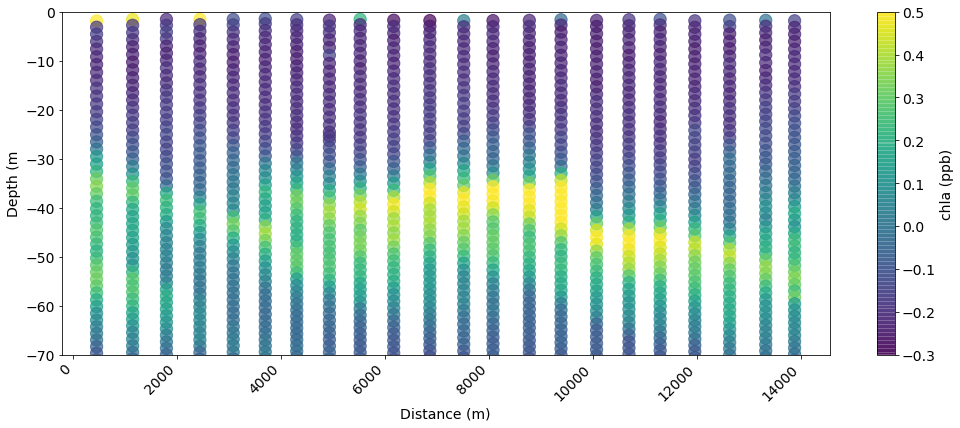

##############################
Transect 9
##############################


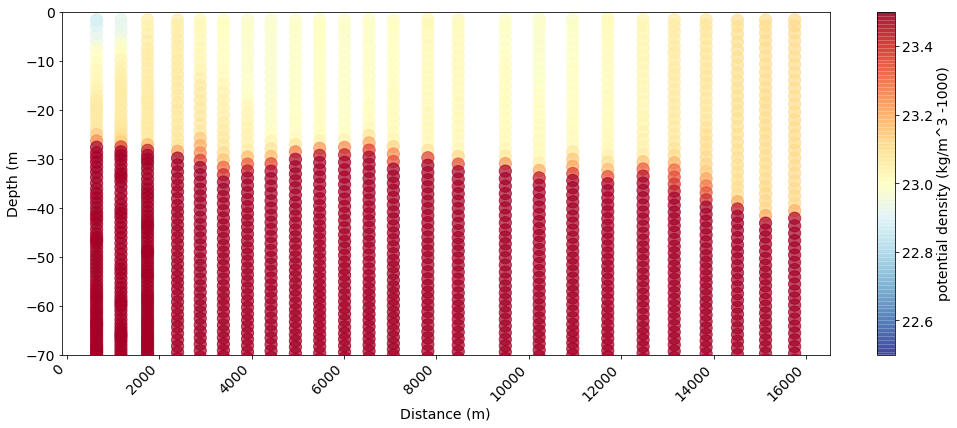

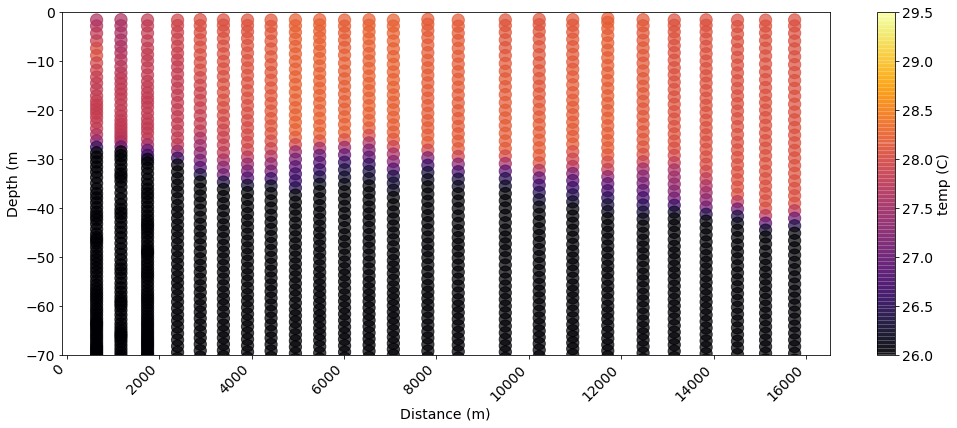

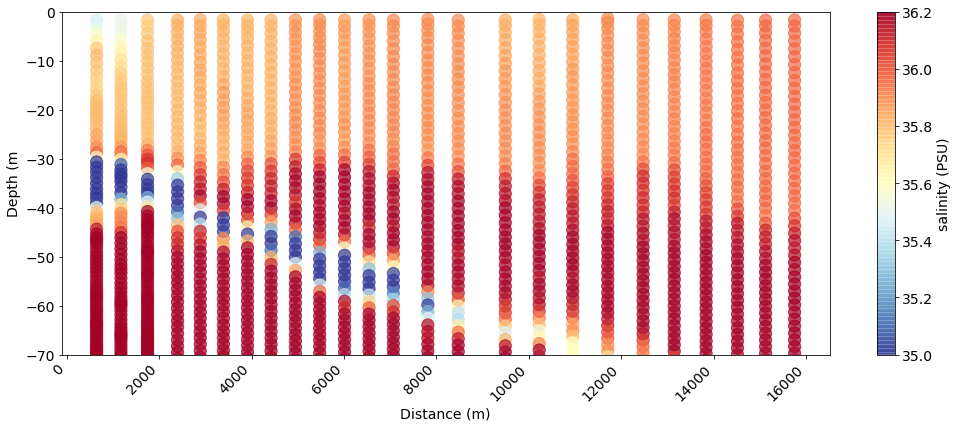

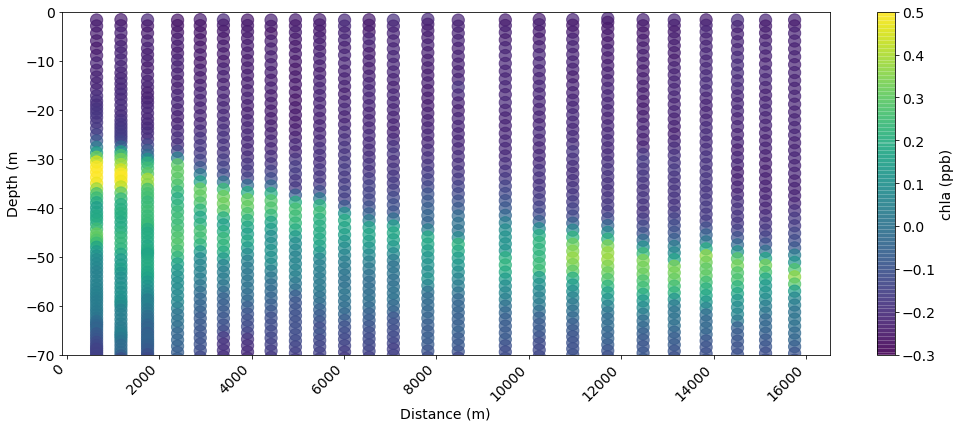

In [121]:
for i in [0,1,4,5,8]:
    plot_profiles(profiles, start_times[i],end_times[i], ['potential density (kg/m^3 -1000)', 'temp (C)', 'salinity (PSU)', 'chla (ppb)'], transect=i,
                         plot=True)

In [69]:
import numpy as np
# from scipy.interpolate import interp2d
import scipy


data_variables = ['temp (C)', 'salinity (PSU)',
       'potential density (kg/m^3 -1000)', 'chla (ppb)', 'turbidity (FTU)',
       'turb kinetic energy 1 (W/kg)', 'turb kinetic energy 2 (W/kg)']

def interpolate_profiles(df, transect, data_variables, plot=False):
    df_subset = df[df.transect == transect]
    interpolated_grids = []
    datetime_list = []
    for i in np.unique(df_subset.profile_num.values):
        datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
    datetime_list = np.array(datetime_list)
    datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')

    # I want to plot the T and S by depth for the first and last profiles
    fig, ax = plt.subplots(1,2, figsize=(8,7))
    prof_initial = df_subset[df_subset.profile_num == df_subset.profile_num.min()]
    ax[0].plot(prof_initial['temp (C)'],prof_initial['depth (dBars)'], color='red')
    ax[0].set_ylim(-100,0)
    ax[0].set_xlim(14,28.8)
    ax2 = ax[0].twiny()
    ax2.set_xlim(30,36.5)
    ax2.plot(prof_initial['salinity (PSU)'],prof_initial['depth (dBars)'], color='blue')
    
    prof_max = df_subset[df_subset.profile_num == df_subset.profile_num.max()]
    ax[1].plot(prof_max['temp (C)'],prof_max['depth (dBars)'], color='red')
    ax[1].set_ylim(-100,0)
    ax[1].set_xlim(14,28.8)
    ax2 = ax[1].twiny()
    ax2.set_xlim(30,36.5)
    ax2.plot(prof_max['salinity (PSU)'],prof_max['depth (dBars)'], color='blue')
#     fig.savefig('figs/sept_'+transect+'_first_last_profile_ts.png')
    
    # Original data (e.g. measurements)
    for data_var in data_variables:        
        if plot:
            norm=None
            
            if data_var == 'temp (C)':
                vmin=25
                vmax=28.5
            elif data_var == 'salinity (PSU)':
                vmin=33.5
                vmax=36.5
            elif data_var == 'potential density (kg/m^3 -1000)':
                vmin=22
                vmax=26.3
            elif data_var == 'chla (ppb)':
                vmin=-0.3
                vmax=0.5
            elif data_var == 'turbidity (FTU)':
                vmin=1
                vmax=1.12
            elif data_var == 'turb kinetic energy 1 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
            elif data_var == 'turb kinetic energy 2 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
                
            # I want to plot the variables averaged from the top 10 meters on a single plot
            fig, ax = plt.subplots(figsize=(8,4))
            # walk through each profile, find the avg of the top 10m and then plot it by time
            var_avgs = []
            var_stds = []
            times = []
            depth = -7
            for prof_num in np.unique(df_subset.profile_num):
                prof_time = df_subset[(df_subset.profile_num == prof_num)].datetime.min()
                tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
#                 print(len(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var]))
                tenm_std = np.std(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
                times.append(prof_time)
                var_avgs.append(tenm_avg)
                var_stds.append(tenm_std)
            var_avgs = np.array(var_avgs)
            var_stds = np.array(var_stds)
            times = np.array(times)
            # I'm doing this because we have some nans for some reason in transect 1 in the surface
            nansInArray1 = np.isnan(var_avgs)
            var_avgs = var_avgs[~nansInArray1]
            var_stds = var_stds[~nansInArray1]
            times = times[~nansInArray1]
            
            ax.set_title(data_var)
            ax.plot(times,var_avgs, color='black')
#             print(times)
#             print(var_avgs)
            ax.scatter(times,var_avgs, color='black')
            ax.plot(times,var_avgs-var_stds, color='black', ls='--')
            ax.plot(times,var_avgs+var_stds, color='black', ls='--')
#             fig.savefig('figs/sept_'+transect+'_surface_avg_profile_'+data_var[:20]+'.png')
            plt.show()
            
            
            
            fig, ax = plt.subplots(figsize=(8,7))
            sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap='RdYlBu_r', s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)
            cb = fig.colorbar(sc)
            ax.set_ylim(-120,0)

            cb.set_label(data_var)
            ax.set_ylabel('Depth (m')
            ax.set_xlabel('Time (UTC)')
            ax.set_title(data_var)
        #     ax[1].xaxis.set_major_locator(plt.MaxNLocator(7))
            fig.autofmt_xdate(rotation=45)
#             ax.xaxis.set_major_locator(plt.MaxNLocator(15))

#             fig.savefig('figs/sept_'+transect+'_profile_'+data_var[:20]+'.png')
            plt.show()

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


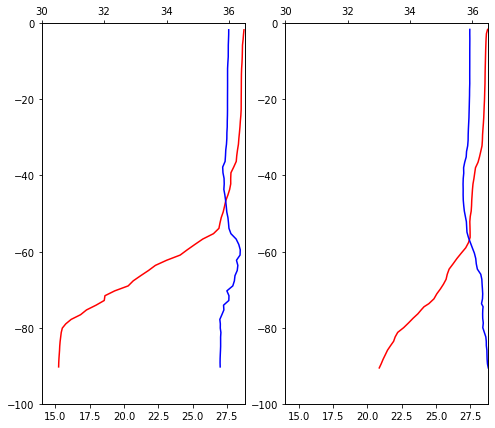

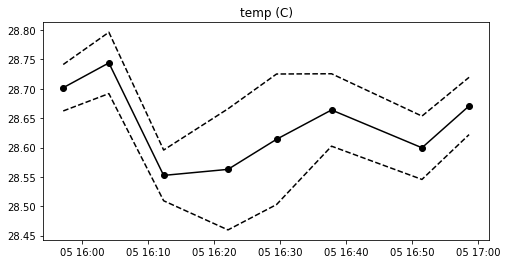

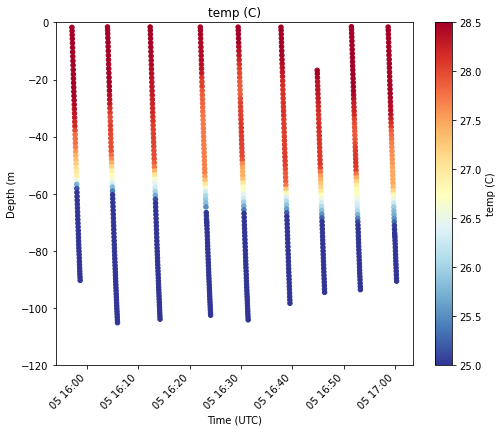

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


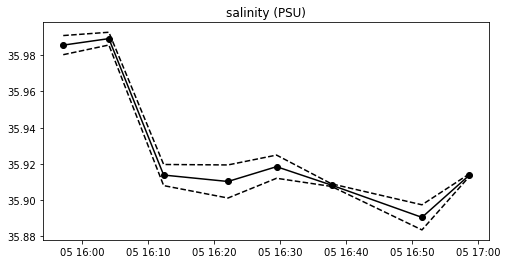

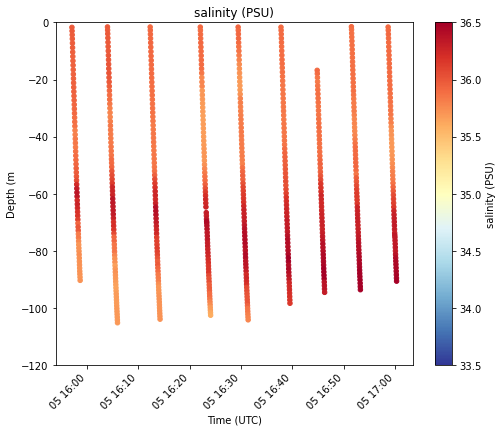

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


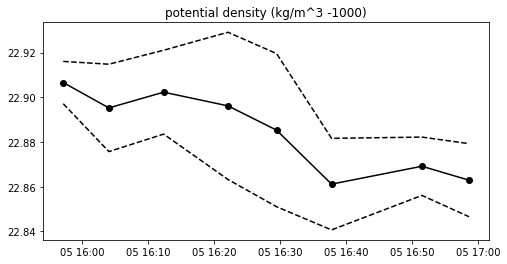

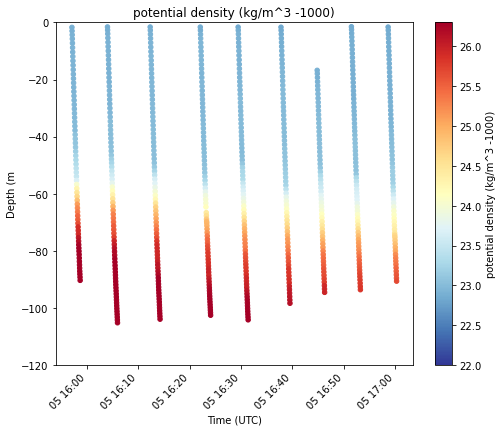

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


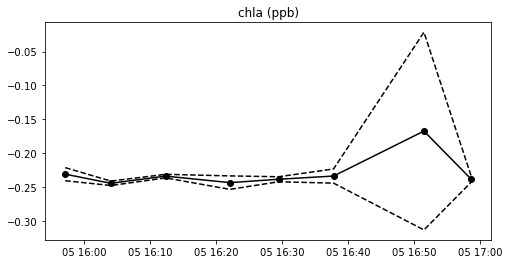

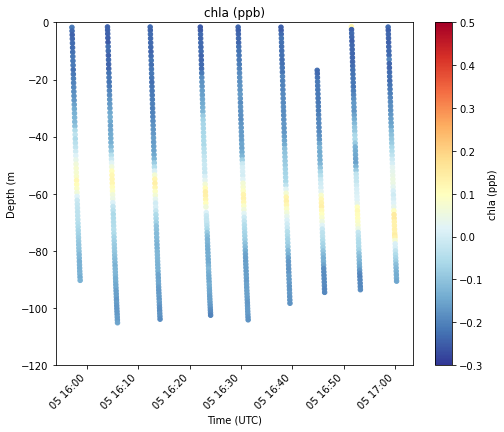

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


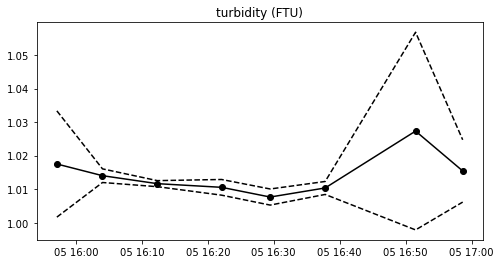

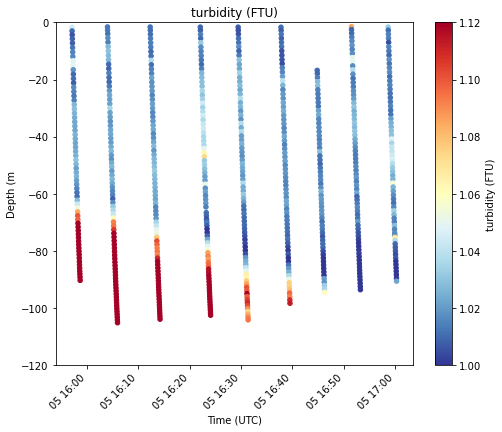

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


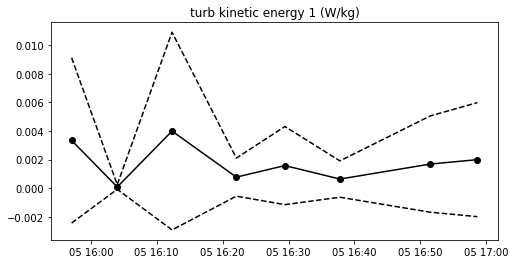

<ipython-input-69-aec075a0014f>:104: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap='RdYlBu_r', s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)


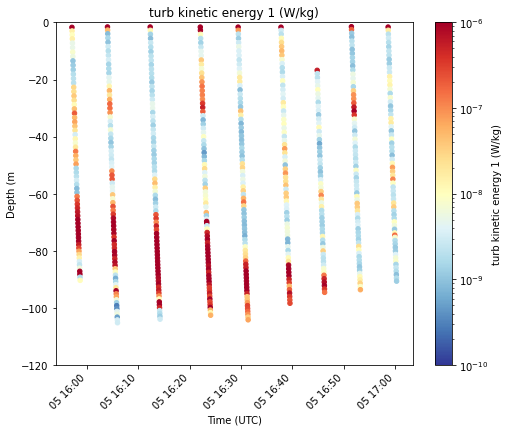

<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])
<ipython-input-69-aec075a0014f>:76: RuntimeWarning: Mean of empty slice
  tenm_avg = np.nanmean(df_subset[(df_subset.profile_num == prof_num) & (df_subset['depth (dBars)'] > depth)][data_var])


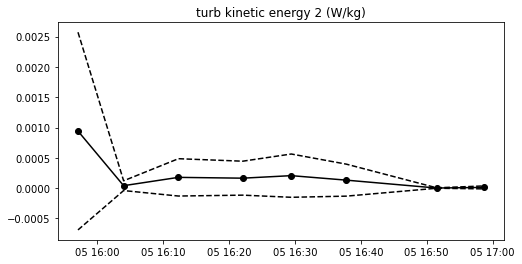

<ipython-input-69-aec075a0014f>:104: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap='RdYlBu_r', s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)


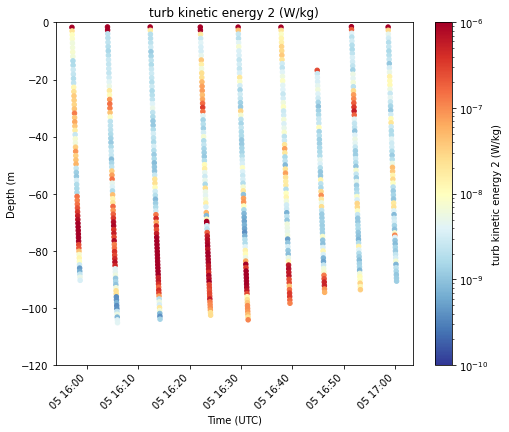

In [70]:
interpolate_profiles(profiles, 'transect_1', data_variables, plot=True)

In [25]:
data_variables

['temp (C)',
 'salinity (PSU)',
 'potential density (kg/m^3 -1000)',
 'chla (ppb)',
 'turbidity (FTU)',
 'turb kinetic energy 1 (W/kg)',
 'turb kinetic energy 2 (W/kg)']

#### Visualizing SST from GOES

In [16]:
goes_ds = xr.open_dataset(data_src+'jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:492: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


In [17]:
day_start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00',  '2021-09-7 12:10:00']
day_end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00',  '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 15:30:00']


In [18]:
day_start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00',  '2021-09-7 12:10:00']
day_end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00',  '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 15:30:00']

dfs = []
for i in range(len(day_start_times)):
    dfs.append(df.loc[day_start_times[i]:day_end_times[i]])
df_subset = pd.concat(dfs)

In [27]:
dfs = []
for i in range(len(day_start_times)):
    dfs.append(gdf.loc[day_start_times[i]:day_end_times[i]])
gdf_subset = pd.concat(dfs)

In [199]:
goes_ds

<xarray.Dataset>
Dimensions:                  (latitude: 301, longitude: 301, time: 733)
Coordinates:
  * time                     (time) object 2021-08-15 00:00:00 ... 2021-09-14...
  * latitude                 (latitude) float32 38.01 37.99 ... 32.03 32.01
  * longitude                (longitude) float32 -77.99 -77.97 ... -72.01 -71.99
Data variables:
    sea_surface_temperature  (time, latitude, longitude) float32 ...
Attributes:
    acknowledgement:            Please acknowledge the use of these data with...
    cdm_data_type:              Grid
    col_count:                  5920
    col_start:                  2290
    comment:                    SSTs are a weighted average of the SSTs of co...
    Conventions:                CF-1.7, COARDS, ACDD-1.3
    creator_email:              Alex.Ignatov@noaa.gov
    creator_name:               Alex Ignatov
    creator_type:               person
    creator_url:                http://www.star.nesdis.noaa.gov
    date_created:               2019-05-02T23:19:39Z
    Easternmost_Easting:        -71.99
    gds_version_id:             02.0
    geospatial_lat_max:         38.01
    geospatial_lat_min:         32.01
    geospatial_lat_resolution:  0.02
    geospatial_lat_units:       degrees_north
    geospatial_lon_max:         -71.99
    geospatial_lon_min:         -77.99
    geospatial_lon_resolution:  0.02
    geospatial_lon_units:       degrees_east
    history:                    Created by the L2P-to-L3U conversion tool,  w...
    id:                         ABI_G16-STAR-L3C-v2.7
    infoUrl:                    https://podaac.jpl.nasa.gov/dataset/ABI_G16-S...
    institution:                NOAA/NESDIS/STAR
    keywords:                   abi, angle, atmosphere, atmospheric, bias, co...
    keywords_vocabulary:        GCMD Science Keywords
    license:                    GHRSST protocol describes data use as free an...
    metadata_link:              <TBD>
    naming_authority:           org.ghrsst
    Northernmost_Northing:      38.01
    platform:                   GOES-16
    processing_level:           L3U
    product_version:            L2P algorithm V2.70; L3U algorithm V4.1.5
    project:                    Group for High Resolution Sea Surface Tempera...
    publisher_email:            ghrsst-po@nceo.ac.uk
    publisher_name:             The GHRSST Project Office
    publisher_type:             group
    publisher_url:              https://www.ghrsst.org
    references:                 Data convention: GHRSST Data Specification (G...
    row_count:                  5920
    row_start:                  1540
    sensor:                     ABI
    source:                     l2p_source : 20181202090000-STAR-L2P_GHRSST-S...
    sourceUrl:                  https://thredds.jpl.nasa.gov/thredds/dodsC/Oc...
    Southernmost_Northing:      32.01
    spatial_resolution:         0.02 deg
    sst_luts:                   LUT_ABI_G16_L2C_DEPTH_DAYNIGHT_V01.06_2019042...
    standard_name_vocabulary:   CF Standard Name Table v70
    Sub_Lon:                    -75.0
    summary:                    Sea surface temperature retrievals produced b...
    testOutOfDate:              now-1day
    time_coverage_end:          2021-09-14T13:00:00Z
    time_coverage_start:        2021-08-15T00:00:00Z
    title:                      GOES-16 ABI L3C SST (ABI G16-STAR-L3C-v2.70),...
    Westernmost_Easting:        -77.99

In [202]:
goes_ds

<xarray.Dataset>
Dimensions:                  (latitude: 301, longitude: 301, time: 733)
Coordinates:
  * time                     (time) object 2021-08-15 00:00:00 ... 2021-09-14...
  * latitude                 (latitude) float32 38.01 37.99 ... 32.03 32.01
  * longitude                (longitude) float32 -77.99 -77.97 ... -72.01 -71.99
Data variables:
    sea_surface_temperature  (time, latitude, longitude) float32 ...
Attributes:
    acknowledgement:            Please acknowledge the use of these data with...
    cdm_data_type:              Grid
    col_count:                  5920
    col_start:                  2290
    comment:                    SSTs are a weighted average of the SSTs of co...
    Conventions:                CF-1.7, COARDS, ACDD-1.3
    creator_email:              Alex.Ignatov@noaa.gov
    creator_name:               Alex Ignatov
    creator_type:               person
    creator_url:                http://www.star.nesdis.noaa.gov
    date_created:               2019-05-02T23:19:39Z
    Easternmost_Easting:        -71.99
    gds_version_id:             02.0
    geospatial_lat_max:         38.01
    geospatial_lat_min:         32.01
    geospatial_lat_resolution:  0.02
    geospatial_lat_units:       degrees_north
    geospatial_lon_max:         -71.99
    geospatial_lon_min:         -77.99
    geospatial_lon_resolution:  0.02
    geospatial_lon_units:       degrees_east
    history:                    Created by the L2P-to-L3U conversion tool,  w...
    id:                         ABI_G16-STAR-L3C-v2.7
    infoUrl:                    https://podaac.jpl.nasa.gov/dataset/ABI_G16-S...
    institution:                NOAA/NESDIS/STAR
    keywords:                   abi, angle, atmosphere, atmospheric, bias, co...
    keywords_vocabulary:        GCMD Science Keywords
    license:                    GHRSST protocol describes data use as free an...
    metadata_link:              <TBD>
    naming_authority:           org.ghrsst
    Northernmost_Northing:      38.01
    platform:                   GOES-16
    processing_level:           L3U
    product_version:            L2P algorithm V2.70; L3U algorithm V4.1.5
    project:                    Group for High Resolution Sea Surface Tempera...
    publisher_email:            ghrsst-po@nceo.ac.uk
    publisher_name:             The GHRSST Project Office
    publisher_type:             group
    publisher_url:              https://www.ghrsst.org
    references:                 Data convention: GHRSST Data Specification (G...
    row_count:                  5920
    row_start:                  1540
    sensor:                     ABI
    source:                     l2p_source : 20181202090000-STAR-L2P_GHRSST-S...
    sourceUrl:                  https://thredds.jpl.nasa.gov/thredds/dodsC/Oc...
    Southernmost_Northing:      32.01
    spatial_resolution:         0.02 deg
    sst_luts:                   LUT_ABI_G16_L2C_DEPTH_DAYNIGHT_V01.06_2019042...
    standard_name_vocabulary:   CF Standard Name Table v70
    Sub_Lon:                    -75.0
    summary:                    Sea surface temperature retrievals produced b...
    testOutOfDate:              now-1day
    time_coverage_end:          2021-09-14T13:00:00Z
    time_coverage_start:        2021-08-15T00:00:00Z
    title:                      GOES-16 ABI L3C SST (ABI G16-STAR-L3C-v2.70),...
    Westernmost_Easting:        -77.99

In [221]:
goes_daily = goes_ds.sea_surface_temperature[320-6*24:-100].resample(time='1D').mean(skipna=True)

In [222]:
goes_daily[4]

<xarray.DataArray 'sea_surface_temperature' (latitude: 301, longitude: 301)>
array([[      nan,       nan,       nan, ..., 27.334093, 27.339998,
        27.352276],
       [      nan,       nan,       nan, ..., 27.260908, 27.281818,
        27.307726],
       [      nan,       nan,       nan, ..., 27.225452, 27.245453,
        27.282728],
       ...,
       [29.13    , 29.08    , 29.05    , ...,       nan, 27.34    ,
        27.35    ],
       [29.095001, 29.045   , 29.025   , ...,       nan,       nan,
              nan],
       [29.05    , 29.1     , 29.093332, ...,       nan,       nan,
              nan]], dtype=float32)
Coordinates:
    time       object 2021-08-26 00:00:00
  * latitude   (latitude) float32 38.01 37.99 37.97 37.95 ... 32.05 32.03 32.01
  * longitude  (longitude) float32 -77.99 -77.97 -77.95 ... -72.03 -72.01 -71.99

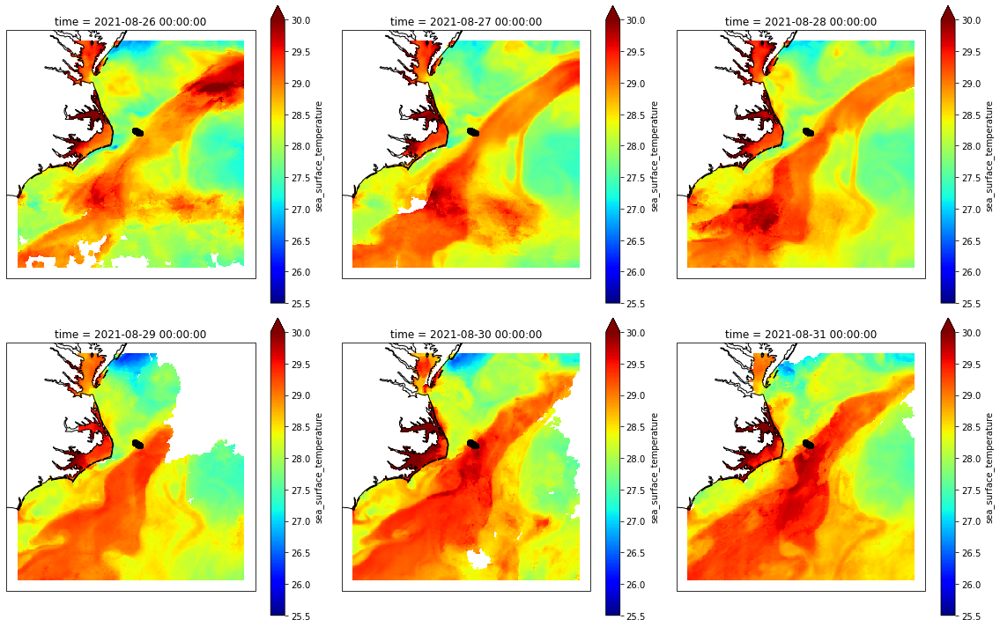

In [224]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(2,3,figsize=(16,10),subplot_kw=dict(projection=crs.PlateCarree()))
for i in range(2):
    for j in range(3):
        ax[i,j].coastlines(resolution='10m')

goes_daily[4].plot(ax=ax[0,0],vmin=25.5, vmax=30, cmap='jet')
goes_daily[5].plot(ax=ax[0,1],vmin=25.5, vmax=30, cmap='jet')
goes_daily[6].plot(ax=ax[0,2],vmin=25.5, vmax=30, cmap='jet')
goes_daily[7].plot(ax=ax[1,0],vmin=25.5, vmax=30, cmap='jet')
goes_daily[8].plot(ax=ax[1,1],vmin=25.5, vmax=30, cmap='jet')
goes_daily[9].plot(ax=ax[1,2],vmin=25.5, vmax=30, cmap='jet')

gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[0,0], color='black', alpha=1)
gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[0,1], color='black', alpha=1)
gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[0,2], color='black', alpha=1)

gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[1,0], color='black', alpha=1)
gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[1,1], color='black', alpha=1)
gdf_subset.loc[day_start_times[0]:day_end_times[0]].plot(ax=ax[1,2], color='black', alpha=1)

fig.tight_layout()


fig.savefig('goes_aug26_31.png',dpi=300)

Create a .gif animation of the GOES SST

command line is

`convert -background white -alpha remove -layers OptimizePlus -delay 18x100 figs/tmp_imgs/sst_goes_hourly*.png -loop 0 figs/sst_goes_hourly.gif`

In [197]:
for i in range(320,320+313):
    fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
    goes_ds.sea_surface_temperature[i].plot(ax=ax, vmin=25,vmax=29.5,cmap=cmocean.cm.thermal )
    gdf_subset.plot(ax=ax, markersize=4, color='red', alpha=1)
    ax.coastlines(resolution='10m')
    #ax.plot([281.5, 285.5], [31, 35], color='grey',linestyle='--')
    #for i, row in gdf[gdf.date==current_date].iterrows():
        #for each one that exists now, find all that match its eddy_id, then run through each pair and plot it
        #ax.scatter(row.lon, row.lat, color='black')
    #gdf_long_tracks[gdf_long_tracks.date==current_date].plot(ax=ax, c='black')
    plt.savefig(f"figs/tmp_imgs/sst_goes_hourly{i:04}.png")
    plt.close()
    #break

In [196]:
goes_ds.sea_surface_temperature[320:320+313]

<xarray.DataArray 'sea_surface_temperature' (time: 313, latitude: 301, longitude: 301)>
[28358113 values with dtype=float32]
Coordinates:
  * time       (time) object 2021-08-28 08:00:00 ... 2021-09-10 08:00:00
  * latitude   (latitude) float32 38.01 37.99 37.97 37.95 ... 32.05 32.03 32.01
  * longitude  (longitude) float32 -77.99 -77.97 -77.95 ... -72.03 -72.01 -71.99
Attributes:
    colorBarMaximum:  32.0
    colorBarMinimum:  0.0
    comment:          SST obtained by regression with buoy measurements, sens...
    grid_mapping:     crs
    ioos_category:    Temperature
    long_name:        Sea Surface Sub-Skin Temperature
    source:           NOAA
    standard_name:    sea_surface_subskin_temperature
    units:            degree_C
    valid_max:        327.67
    valid_min:        -327.67

In [194]:
goes_ds.sea_surface_temperature[320:-100,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df_subset.hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

In [24]:
goes_ds.sea_surface_temperature[546]

<xarray.DataArray 'sea_surface_temperature' (latitude: 301, longitude: 301)>
array([[  nan,   nan,   nan, ...,   nan, 26.49, 26.5 ],
       [  nan,   nan,   nan, ..., 26.5 , 26.52, 26.55],
       [  nan,   nan,   nan, ..., 26.6 , 26.59, 26.6 ],
       ...,
       [29.53, 29.54, 29.56, ..., 28.49, 28.46, 28.43],
       [29.53, 29.57, 29.58, ..., 28.5 , 28.47, 28.44],
       [29.56, 29.57, 29.58, ..., 28.5 , 28.47, 28.41]], dtype=float32)
Coordinates:
    time       object 2021-09-06 18:00:00
  * latitude   (latitude) float32 38.01 37.99 37.97 37.95 ... 32.05 32.03 32.01
  * longitude  (longitude) float32 -77.99 -77.97 -77.95 ... -72.03 -72.01 -71.99
Attributes:
    colorBarMaximum:  32.0
    colorBarMinimum:  0.0
    comment:          SST obtained by regression with buoy measurements, sens...
    grid_mapping:     crs
    ioos_category:    Temperature
    long_name:        Sea Surface Sub-Skin Temperature
    source:           NOAA
    standard_name:    sea_surface_subskin_temperature
    units:            degree_C
    valid_max:        327.67
    valid_min:        -327.67

In [32]:
bathy_ds = xr.open_dataset('../sat_ocean_color/bathymetry/GEBCO_2020_23_Oct_2020_c3e0a2c71e39/gebco_2020_n41.220703125_s24.7412109375_w-82.6611328125_e-59.765625.nc')

In [97]:
bathy_ds.elevation[2000:3000,1000:2500].hvplot.quadmesh(
    'lon', 'lat', projection=crs.PlateCarree(), project=True,
    cmap='terrain', dynamic=True, 
    frame_height=600, rasterize=True) * df_subset.hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05)

:DynamicMap   []
   :Overlay
      .Image.I  :Image   [lon,lat]   (elevation)
      .Points.I :Points   [lon,lat]

In [33]:
bathy_ds

<xarray.Dataset>
Dimensions:    (lat: 3955, lon: 5495)
Coordinates:
  * lat        (lat) float64 24.74 24.75 24.75 24.76 ... 41.21 41.21 41.21 41.22
  * lon        (lon) float64 -82.66 -82.66 -82.65 ... -59.78 -59.77 -59.77
Data variables:
    elevation  (lat, lon) int16 ...
Attributes:
    Conventions:  CF-1.6
    title:        The GEBCO_2020 Grid - a continuous terrain model for oceans...
    institution:  On behalf of the General Bathymetric Chart of the Oceans (G...
    source:       The GEBCO_2020 Grid is the latest global bathymetric produc...
    history:      Information on the development of the data set and the sour...
    references:   DOI: 10.5285/a29c5465-b138-234d-e053-6c86abc040b9
    comment:      The data in the GEBCO_2020 Grid should not be used for navi...
    node_offset:  1.0

<xarray.DataArray 'latitude' ()>
array(34.52999878)
Coordinates:
    time     object 2021-09-06 18:00:00

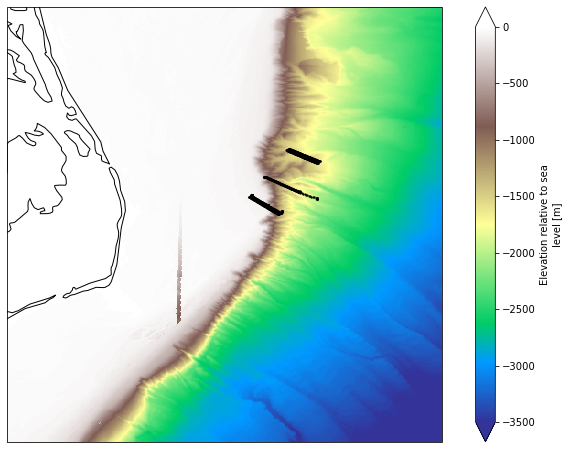

In [67]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
bathy_ds.elevation[2000:3000,1000:2500].plot(ax=ax,vmin=-3500,vmax=0,cmap='terrain')
gdf_subset.plot(ax=ax, markersize=2, color='black', alpha=.8)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

ax.set_ylim(goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.max())
ax.set_xlim(goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.max())



fig.savefig('bathy_transects.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [102]:
goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.max()


(<xarray.DataArray 'latitude' ()>
 array(34.52999878)
 Coordinates:
     time     object 2021-09-06 18:00:00,
 <xarray.DataArray 'latitude' ()>
 array(36.50999832)
 Coordinates:
     time     object 2021-09-06 18:00:00)

In [103]:
goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.max()

(<xarray.DataArray 'longitude' ()>
 array(-75.98999786)
 Coordinates:
     time     object 2021-09-06 18:00:00,
 <xarray.DataArray 'longitude' ()>
 array(-74.01000214)
 Coordinates:
     time     object 2021-09-06 18:00:00)

In [158]:
start_times[4],end_times[4]

('2021-09-6 12:30:00', '2021-09-6 15:00:00')

In [174]:
import cmocean

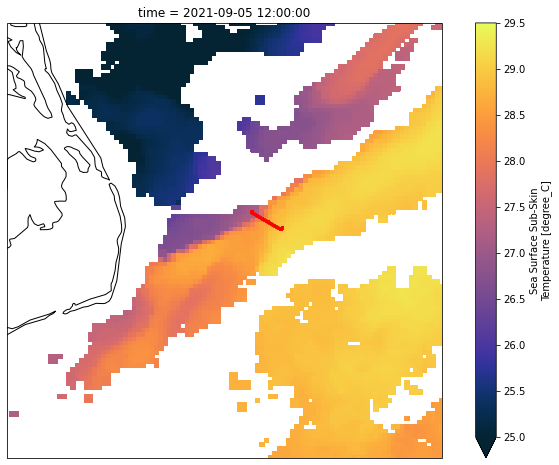

In [186]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[546-30,75:175, 100:200].plot(ax=ax, vmin=25, vmax=29.5, cmap=cmocean.cm.thermal)
gdf_subset.loc[start_times[0]:end_times[0]].plot(ax=ax, markersize=3, color='red', alpha=1)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

ax.set_ylim(goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.max())
ax.set_xlim(goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.max())

fig.savefig('goes_sst_sept0512.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

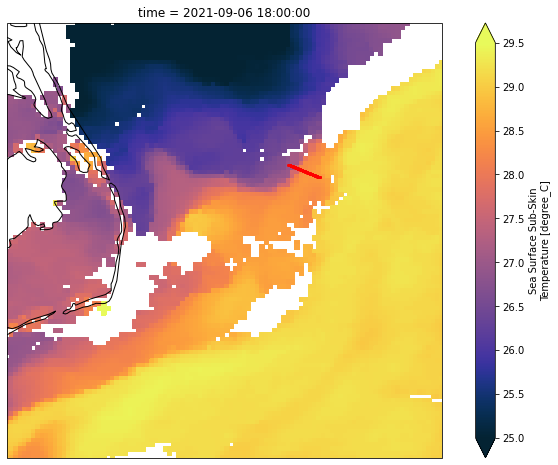

In [189]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[546,75:175, 100:200].plot(ax=ax, vmin=25, vmax=29.5, cmap=cmocean.cm.thermal)
gdf_subset.loc[start_times[4]:end_times[4]].plot(ax=ax, markersize=4, color='red', alpha=1)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

ax.set_ylim(goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].latitude.max())
ax.set_xlim(goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.min(), goes_ds.sea_surface_temperature[546,75:175, 100:200].longitude.max())

fig.savefig('goes_sst_sept0618.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
# fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [ ]:
i=5
fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])+timedelta(hours=2), pd.to_datetime(end_times[i])+timedelta(hours=0))).sea_surface_temperature[:,75:170, 110:200].mean(dim='time').plot(ax=ax, vmin=25.5, vmax=29.5, cmap='inferno')

gdf.loc[start_times[i]:end_times[i]].plot(ax=ax, markersize=30, color='lime')

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [9]:
plt.rcParams.update({'font.size': 16})

### ADCP Data

In [3]:
import scipy.io

In [13]:
arrow_scaler = 2.5

In [14]:
u = arrow_scaler*+1*np.sin((np.pi/180)*45)
v = arrow_scaler*+1*np.cos((np.pi/180)*45)
u,v

(1.7677669529663687, 1.7677669529663689)

In [15]:
plt.rcParams.update({'font.size': 16})

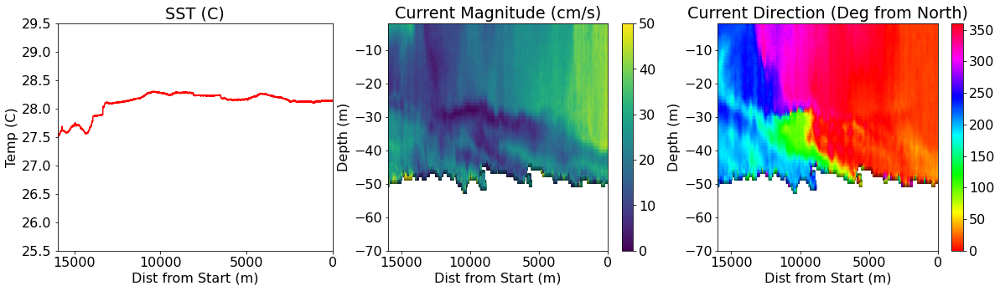

/srv/conda/envs/notebook/lib/python3.8/site-packages/matplotlib/patches.py:1338: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  verts = np.dot(coords, M) + (x + dx, y + dy)


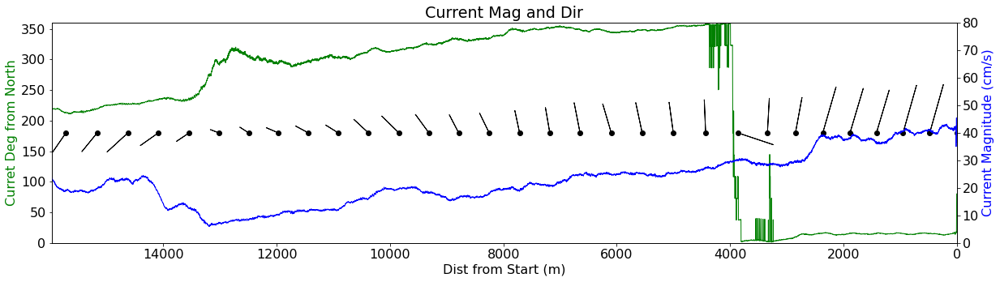

--------------------------------------


In [20]:
transect_num = [2,5,6,9]
for idx,fn in enumerate([data_src+'adcp/processed/101706_20210905T145056UTC_100s', 
           data_src+'adcp/processed/101706_20210906T121429UTC_100s',
           data_src+'adcp/processed/101706_20210906T164454UTC_100s',
           data_src+'adcp/processed/101706_20210907T123502UTC_100s']):
# transect_num = [9]
# for idx,fn in enumerate([
#            data_src+'adcp/processed/101706_20210907T123502UTC_100s']):
    if idx != 3:
        pass
    else:

        dist = scipy.io.loadmat(fn+'_distance.mat')['distance']
        sst = scipy.io.loadmat(fn+'_SST.mat')['SST']
        time = scipy.io.loadmat(fn+'_time.mat')['time']

        X = scipy.io.loadmat(fn+'_X.mat')['X']
        Y = scipy.io.loadmat(fn+'_Y.mat')['Y']
        vMag = scipy.io.loadmat(fn+'_vmag.mat')['C']

        vDir = scipy.io.loadmat(fn+'_vdir.mat')['C']

        fig, ax = plt.subplots(1,3, figsize=(20,5))
        ax[0].plot(dist,sst, color='red')
        ax[0].set_ylim(25.5,29.5)
        ax[0].set_title("SST (C)")
        ax[0].set_ylabel('Temp (C)')
        ax[0].set_xlabel('Dist from Start (m)')

    #     ax.plot((time[0]-time[0].min())*24,sst)
    #     ax.set_ylim(25.5,29.5)
        vMag_reshape = vMag.reshape(-1,69).T
        vDir_reshape = vDir.reshape(-1,69).T

        x, y = np.meshgrid(X.reshape(-1,69)[:,0],Y[:69,0])    
        im = ax[1].pcolormesh(x,y,vMag_reshape,shading='gouraud', vmin=0,vmax=50)
        fig.colorbar(im,ax=ax[1])
        ax[1].set_title("Current Magnitude (cm/s)")
        ax[1].set_ylabel('Depth (m)')
        ax[1].set_xlabel('Dist from Start (m)')


        im = ax[2].pcolormesh(x,y,vDir_reshape,shading='gouraud', vmin=0,vmax=360, cmap='hsv')
        fig.colorbar(im,ax=ax[2])
        ax[2].set_title("Current Direction (Deg from North)")
        ax[2].set_ylabel('Depth (m)')
        ax[2].set_xlabel('Dist from Start (m)')

        if idx == 3:
            for i in range(3):
                ax[i].set_xlim(x.max(),0)
        else:
            for i in range(3):
                ax[i].set_xlim(0,dist.max())

        fig.savefig('sst_mag_dir_'+str(transect_num[idx])+'.png',dpi=400)
        plt.show()

        ######

        current_speed = np.mean(vMag_reshape[10:20,:],axis=0)
        current_dir =  np.mean(vDir_reshape[10:20,:],axis=0)

        current_speed_10 = np.mean(vMag_reshape[:10,:],axis=0)
        current_dir_10 =  np.mean(vDir_reshape[:10,:],axis=0)

        fig, ax = plt.subplots(1, 1,figsize=(20, 5))
    #     ax.plot(dist, current_dir, linewidth=2, color='green')
        ax.plot(dist, current_dir_10, linewidth=1, color='green')
        ax.set_ylim(0,360)

        ax_speed = ax.twinx()
    #     ax_speed.plot(dist, current_speed, linewidth=2, color='blue')
        ax_speed.plot(dist, current_speed_10, linewidth=1, color='blue')
        ax_speed.set_ylim(0,80)

        x_step_size = 20/dist.max()
        y_step_size = 5/360
        norm_steps = y_step_size / x_step_size

        arrow_scaler = 2
        for i in np.arange(0,len(dist),300):
            u = arrow_scaler*-1*np.sin((np.pi/180)*(current_dir_10[i])) * norm_steps * current_speed_10[i]
            v = arrow_scaler*1*np.cos((np.pi/180)*(current_dir_10[i])) * current_speed_10[i]

            ax.arrow(dist[i], 180, u, v, fc='k', ec='k', head_width=0, head_length=0)
            ax.scatter(dist[i], 180,c='black')

        if idx == 3:
            ax.set_xlim(dist.max(),0)
        else:
            ax.set_xlim(0,dist.max())

        ax.set_title("Current Mag and Dir")
        ax.set_ylabel('Curret Deg from North')
        ax_speed.set_ylabel('Current Magnitude (cm/s)')
        ax.set_xlabel('Dist from Start (m)')

        ax.yaxis.label.set_color('green')
        ax_speed.yaxis.label.set_color('blue')

        fig.savefig('top_10m_20m_mag_dir_'+str(transect_num[idx])+'.png',dpi=400)

        plt.show()

        print('--------------------------------------')

In [251]:
y[10:20,0]

array([-12, -13, -14, -15, -16, -17, -18, -19, -20, -21], dtype=int16)

11.092869602411808

## Working through each transect with data and SST

<GeoAxesSubplot:title={'center':'time = 2021-08-19T04:00:00'}, xlabel='Longitude [degrees_east]', ylabel='Latitude [degrees_north]'>

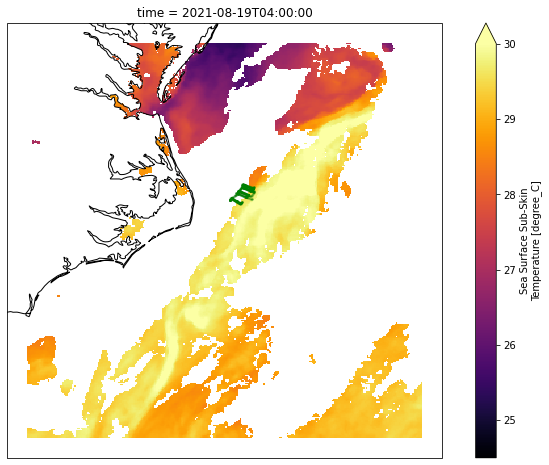

In [35]:
fig, ax = plt.subplots(figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sea_surface_temperature[100,:, :].plot(ax=ax, vmin=24.5, vmax=30, cmap='inferno')
gdf.loc['2021-09-5 11:00:00':'2021-09-7 15:30:00'].plot(ax=ax, markersize=2, color='green', alpha=.05)
# fig.savefig('sst_sept0523_studypoints.png',dpi=400)

In [30]:
plt.rcParams.update({'font.size': 16})

In [31]:
start_times

['2021-09-5 13:00:00',
 '2021-09-5 18:15:00',
 '2021-09-6 1:00:00',
 '2021-09-6 5:10:00',
 '2021-09-6 12:30:00',
 '2021-09-6 16:45:00',
 '2021-09-7 2:55:00',
 '2021-09-7 6:45:00',
 '2021-09-7 12:10:00']

In [98]:
start_times[5], end_times[5]

('2021-09-6 16:45:00', '2021-09-6 19:20:00')

In [107]:
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])+timedelta(hours=2), pd.to_datetime(end_times[i])+timedelta(hours=0)))

<xarray.Dataset>
Dimensions:                  (latitude: 301, longitude: 301, time: 1)
Coordinates:
  * time                     (time) datetime64[ns] 2021-09-06T19:00:00
  * latitude                 (latitude) float32 38.01 37.99 ... 32.03 32.01
  * longitude                (longitude) float32 -77.99 -77.97 ... -72.01 -71.99
Data variables:
    sea_surface_temperature  (time, latitude, longitude) float32 ...
Attributes: (12/56)
    acknowledgement:            Please acknowledge the use of these data with...
    cdm_data_type:              Grid
    col_count:                  5920
    col_start:                  2290
    comment:                    SSTs are a weighted average of the SSTs of co...
    Conventions:                CF-1.7, COARDS, ACDD-1.3
    ...                         ...
    summary:                    Sea surface temperature retrievals produced b...
    testOutOfDate:              now-1day
    time_coverage_end:          2021-09-14T13:00:00Z
    time_coverage_start:        2021-08-15T00:00:00Z
    title:                      GOES-16 ABI L3C SST (ABI G16-STAR-L3C-v2.70),...
    Westernmost_Easting:        -77.99

In [104]:
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=1), pd.to_datetime(end_times[i])+timedelta(hours=1))).sea_surface_temperature[:,75:170, 110:200].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True)

:DynamicMap   [time]
   :Image   [longitude,latitude]   (sea_surface_temperature)

In [100]:
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])+timedelta(hours=1), pd.to_datetime(end_times[i])-timedelta(hours=1))).sea_surface_temperature[:,75:170, 110:200].plot(ax=ax, vmin=25.5, vmax=29.5, cmap='inferno')

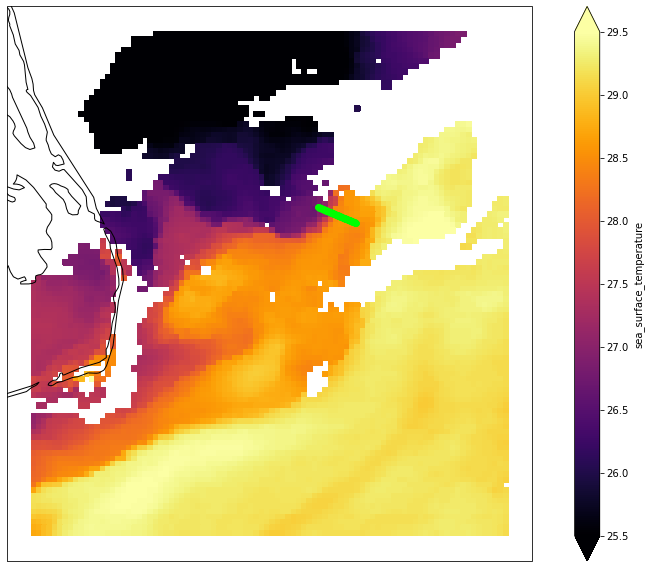

In [159]:
i=5
fig, ax = plt.subplots(1,1, figsize=(12,8), subplot_kw=dict(projection=crs.PlateCarree()))
ax.coastlines(resolution='10m')
goes_ds.sel(time=slice(pd.to_datetime(start_times[i])+timedelta(hours=2), pd.to_datetime(end_times[i])+timedelta(hours=0))).sea_surface_temperature[:,75:170, 110:200].mean(dim='time').plot(ax=ax, vmin=25.5, vmax=29.5, cmap='inferno')

gdf.loc[start_times[i]:end_times[i]].plot(ax=ax, markersize=30, color='lime')

# fig.savefig('sst_sept0619_studypoints.png',dpi=400)
# ax[1].set_title(titles[i] + ' zoom')
fig.tight_layout()
#     fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     plt.close()

# fcm_gdf.plot(ax=ax, markersize=15, column='Chla_Avg', vmin=.1,vmax=.25, cmap='jet')
# plt.savefig('sampling_locations_sept4-9.png',dpi=300)
plt.show()

In [ ]:
fcm_df['Chla_Avg'][fcm_df['Chla_Avg']==-999]=np.nan

In [27]:
tn_names = ['transect_1', 'transect_2', 'transect_3', 'transect_4', 'transect_5', 'transect_6', 'transect_7', 'transect_8', 'transect_9']

In [28]:
# bad practice but they're too noisy
import warnings
warnings.filterwarnings("ignore")

<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:55: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p4, =

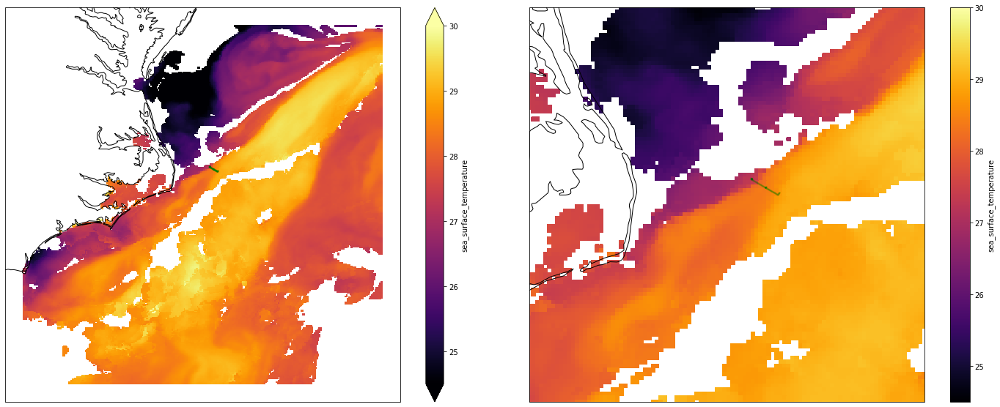

<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)


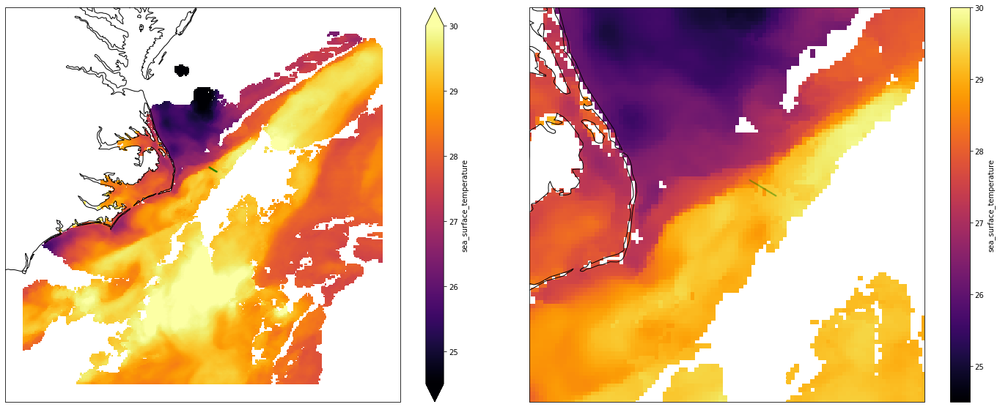

<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:55: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p4, =

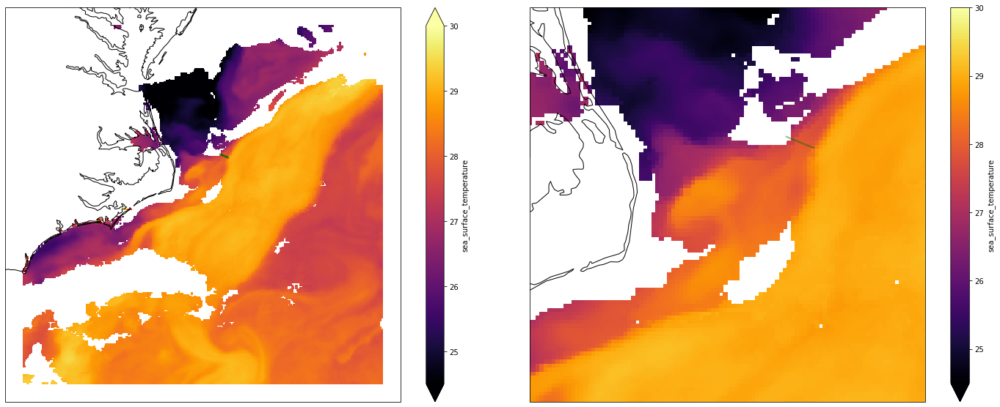

<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:55: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p4, =

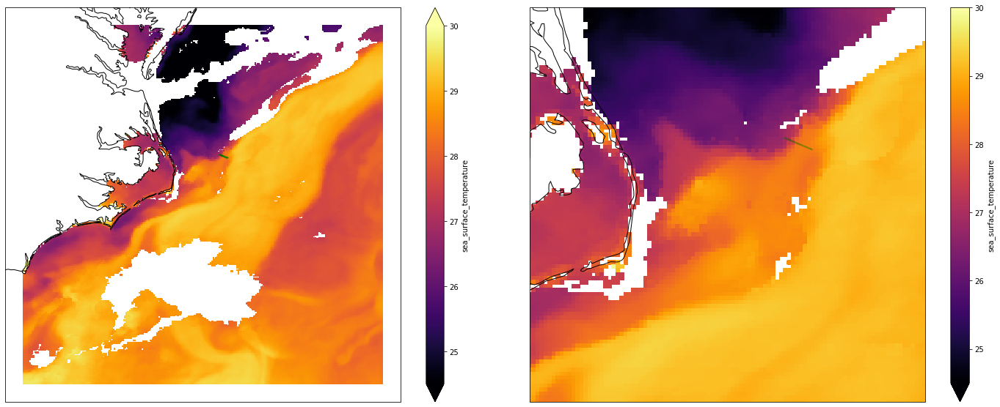

<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:53: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)
<ipython-input-121-bc22957598f3>:55: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  p4, =

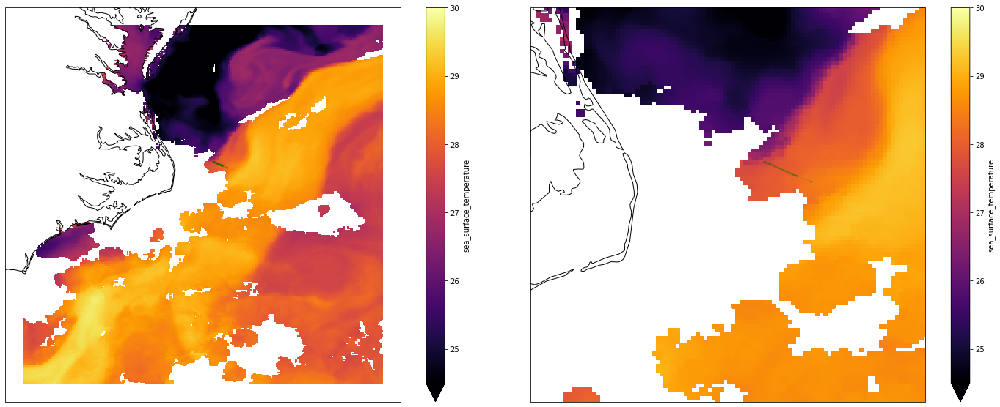

In [121]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

for i in [0,1,4,5,8]:
        # time series plot
        fig, ax = plt.subplots(figsize=(20,7))

        ax1 = ax.twinx()
        ax2 = ax.twinx()
        ax3 = ax.twinx()
        ax4 = ax.twinx()
        ax5 = ax.twinx()
        ax6 = ax.twinx()
        ax7 = ax.twinx()
        ax8 = ax.twinx()

        ax.set_ylim(25.5, 30.5)
        ax1.set_ylim(33, 37)
        ax1.axhline(35.7)
        ax1.axhline(34.5)
        ax2.set_ylim(.08, .2)
#         ax3.set_ylim(15000, 150000)
#         ax4.set_ylim(700, 5700)
#         ax5.set_ylim(35000, 150000)
#         ax6.set_ylim(160000, 500000)
        ax7.set_ylim(.1, .44)
    
        ax.set_xlim(pd.to_datetime(start_times[i]),pd.to_datetime(end_times[i]))
        
        ax3.set_yscale('log')
        ax4.set_yscale('log')
        ax5.set_yscale('log')
        ax6.set_yscale('log')

        ax.set_xlabel("Time (UTC)")
        ax.set_ylabel("Temperature (C)")
        ax1.set_ylabel("Salinity (PSU)")
        ax2.set_ylabel("CDOM (volts)")
        ax3.set_ylabel("Syn/mL")
        ax4.set_ylabel("Peuks/mL")
        ax5.set_ylabel("PicoCyano/mL")
        ax6.set_ylabel("Bacteria/mL")
        ax7.set_ylabel("Chla mg/m3")
        ax8.set_ylabel('NCP mmol C m-2 d-1')

        p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp', lw=3)
        p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity', lw=3)
        p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)

        p4, = ax3.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['SynA'], label='Syn/mL', color='purple')
        p5, = ax4.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['PeuksA'], label='Peuks/mL', color='yellow')
        p6, = ax5.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['PicoCyanoA'], label='PicoCyano/mL', color='blue')
        p7, = ax6.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Bacteria_Avg'], label='Bacteria/mL', color='grey')
        p8, = ax7.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Chla_Avg'], label='Chla mg/m3', color='green')    
        p9, = ax8.plot(df_ncp.loc[start_times[i]:end_times[i]].index, df_ncp.loc[start_times[i]:end_times[i]]['NCP mmol C m-2 d-1'], label='NCP mmol C m-2 d-1', color='lightsalmon')    
         
        
#         ax.set_title(titles[i])

        lns = [p1, p2, p3, p4,p5,p6,p7,p8, p9]
        #ax.legend(handles=lns, loc='best')

        # right, left, top, bottom
        ax2.spines['right'].set_position(('outward', 80))
        ax3.spines['right'].set_position(('outward', 160))
        ax4.spines['right'].set_position(('outward', 250))
        ax5.spines['right'].set_position(('outward', 345))
        ax6.spines['right'].set_position(('outward', 440))
        ax7.spines['right'].set_position(('outward', 540))
        ax8.spines['right'].set_position(('outward', 640))

        # no x-ticks                 
    #     ax2.xaxis.set_ticks([])
        fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')

        ax.yaxis.label.set_color(p1.get_color())
        ax1.yaxis.label.set_color(p2.get_color())
        ax2.yaxis.label.set_color('brown')
        ax3.yaxis.label.set_color(p4.get_color())
        ax4.yaxis.label.set_color(p5.get_color())
        ax5.yaxis.label.set_color(p6.get_color())
        ax6.yaxis.label.set_color(p7.get_color())
        ax7.yaxis.label.set_color(p8.get_color())
        ax8.yaxis.label.set_color(p9.get_color())

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
#         fig.savefig('figs/'+titles[i] +'.png')
    #     plt.close()
        plt.close()
        
        fig, ax = plt.subplots(figsize=(10,8))
        sc = ax.scatter(df.loc[start_times[i]:end_times[i]]['TSG--sal'],  df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], alpha=0.8,c=df.loc[start_times[i]:end_times[i]]['lon'], cmap='cividis', label='chla')
        ax.set_xlim(33,37)
        ax.set_ylim(25,31)
        
        ax.set_xlabel("Salinity")
        ax.set_ylabel("Temperature")
        ax.axvline(35.7)
        ax.axvline(34.5)

#         fig.savefig('figs/s_t_diagram'+titles[i] +'.png')
        fig.colorbar(sc)
        
#         if i in [0,1,4,5,8]:        
#             dates, interpolated_grids = interpolate_profiles(profiles, tn_names[i], ['potential density (kg/m^3 -1000)'], plot=True)

        plt.close()

        # SST image

        fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
        ax[0].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)

        ax[1].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
        # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
#         ax[0].set_title(titles[i] + ' overview')
#         ax[1].set_title(titles[i] + ' zoom')
        ax[1].set_ylim(34.52999878,36.50999832)
        ax[1].set_xlim(-75.98999786,-74.01000214)
        fig.tight_layout()
#         fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()
        plt.show()

        # fig.savefig('transect' + str(i) '_s_t.png')

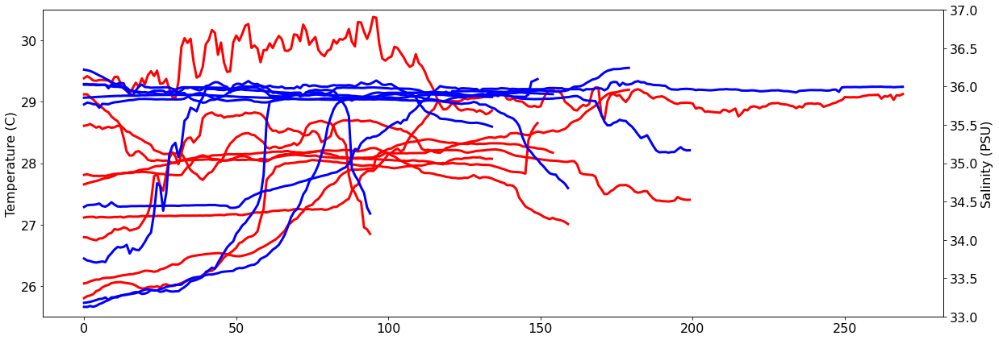

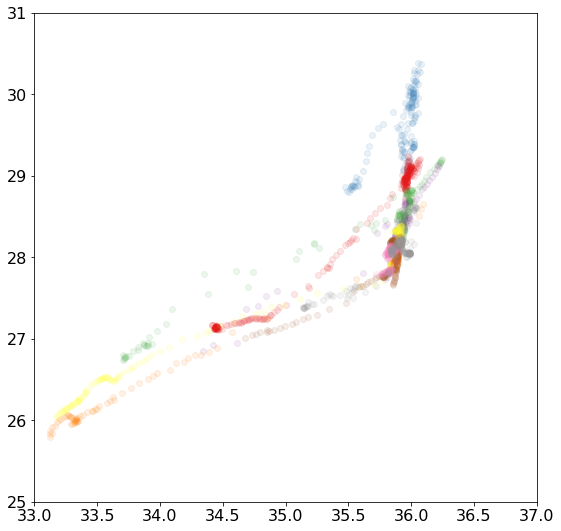

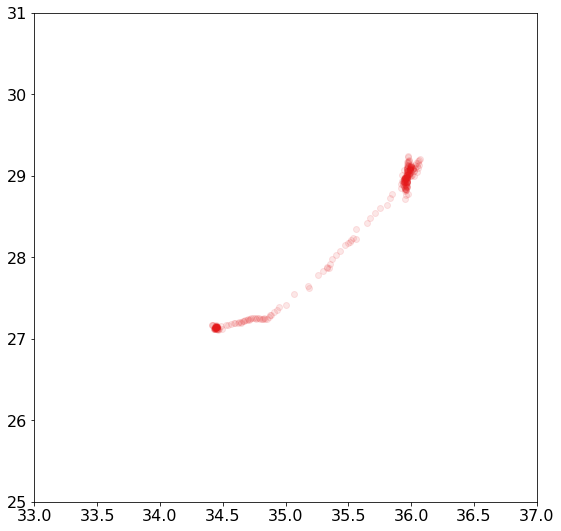

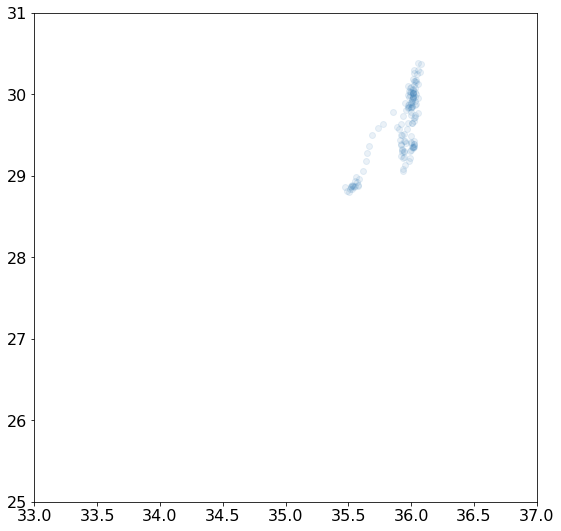

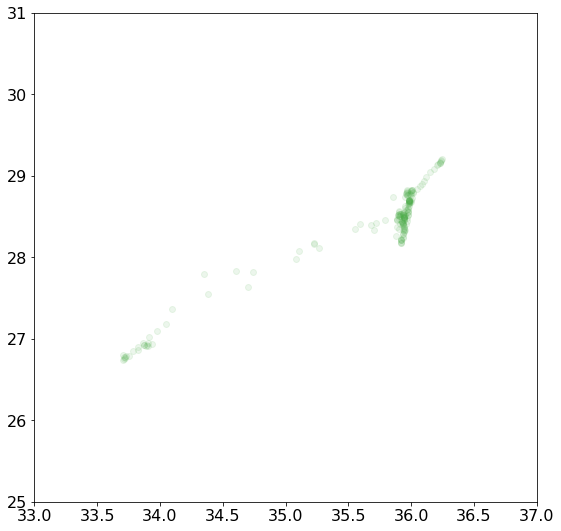

...

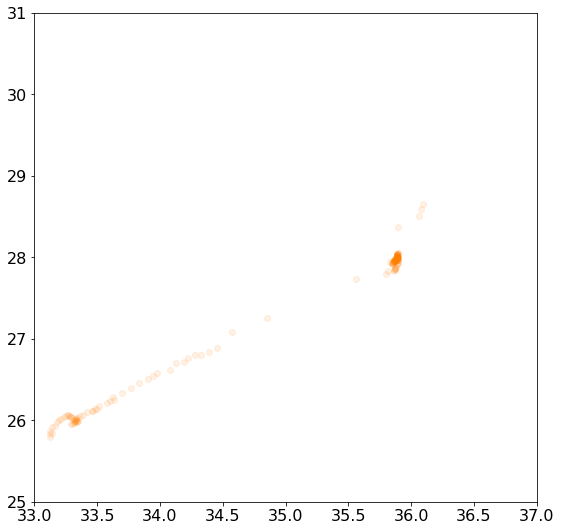

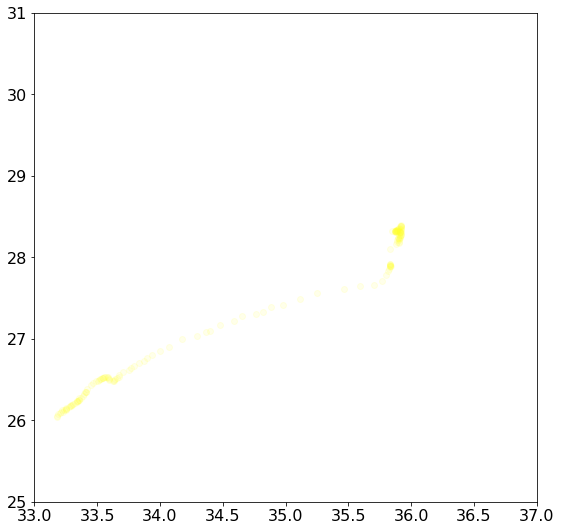

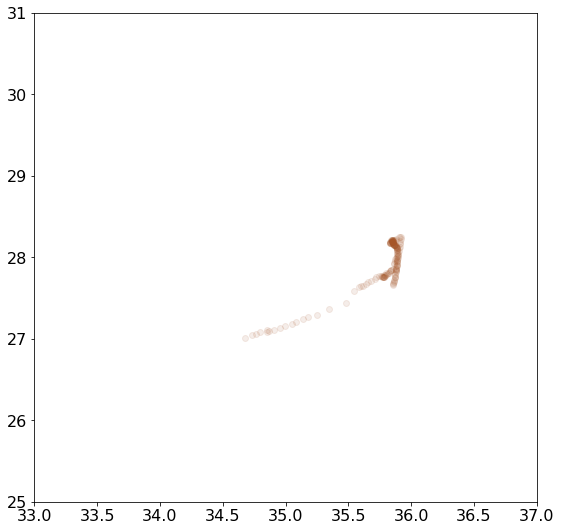

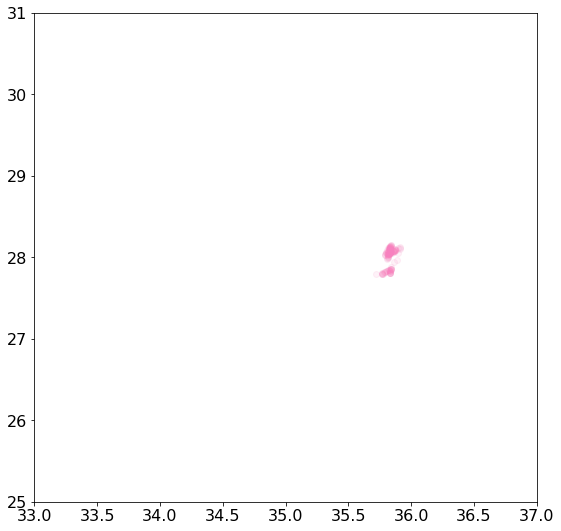

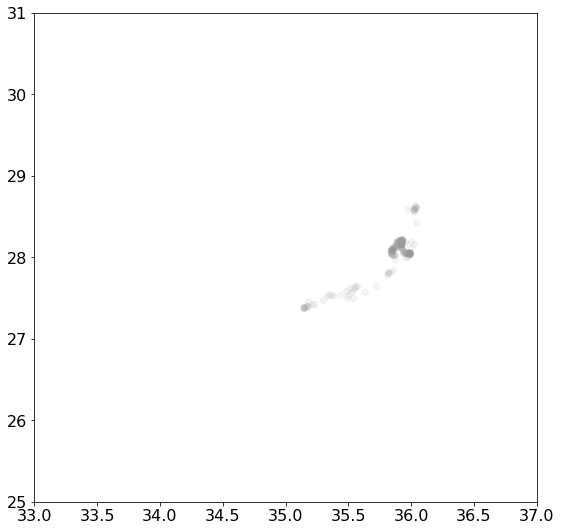

In [153]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Likely non-eddy: Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Likely eddy: Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

fig, ax = plt.subplots(figsize=(20,7))
ax1 = ax.twinx()

ax.set_ylim(25.5, 30.5)
ax1.set_ylim(33, 37)

#         ax.set_xlabel("Time (UTC)")
ax.set_ylabel("Temperature (C)")
ax1.set_ylabel("Salinity (PSU)")
for i in range(9):
        p1, = ax.plot(range(len(df.loc[start_times[i]:end_times[i]])), df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp', lw=3)
        p2, = ax1.plot(range(len(df.loc[start_times[i]:end_times[i]])), df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity', lw=3, color='blue')
#         p3 = ax2.scatter(range(len(cdom_df.loc[start_times[i]:end_times[i]])), cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)

# Adjust spacings w.r.t. figsize
# fig.tight_layout()
# fig.savefig('figs/'+titles[i] +'.png')
# #     plt.close()
plt.show()

fig, ax = plt.subplots(figsize=(9,9))
color_list = plt.cm.Set1(np.linspace(0, 1, 9))

for i in range(9):
    ax.scatter(df.loc[start_times[i]:end_times[i]]['TSG--sal'],  df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], alpha=0.1,color=color_list[i])
    ax.set_xlim(33,37)
    ax.set_ylim(25,31)
plt.show()

for i in range(9):
    fig, ax = plt.subplots(figsize=(9,9))
    ax.scatter(df.loc[start_times[i]:end_times[i]]['TSG--sal'],  df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], alpha=0.1,color=color_list[i])
    ax.set_xlim(33,37)
    ax.set_ylim(25,31)
    plt.show()
        
#         fig, ax = plt.subplots(figsize=(10,8))
#         ax.scatter(df.loc[start_times[i]:end_times[i]]['TSG--sal'],  df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], alpha=0.8,c=df.loc[start_times[i]:end_times[i]]['lon'], cmap='cividis', label='chla')
# #         ax.set_xlim(32,36)
#         ax.set_ylim(28,29)
        
# ax.set_xlabel("Salinity")
# ax.set_ylabel("Temperature")

# fig.savefig('figs/s_t_diagram'+titles[i] +'.png')
# fig.colorbar(sc)
        

        # fig.savefig('transect' + str(i) '_s_t.png')

<ipython-input-190-7cfa82af7f49>:10: FutureWarning: Value based partial slicing on non-monotonic DatetimeIndexes with non-existing keys is deprecated and will raise a KeyError in a future Version.
  if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:


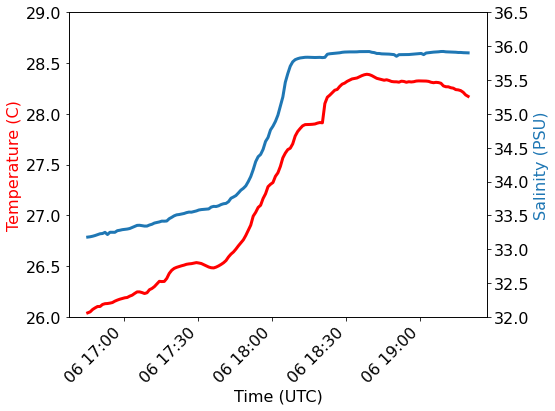

In [190]:
start_times = ['2021-09-5 13:00:00', '2021-09-5 18:15:00', '2021-09-6 1:00:00', '2021-09-6 5:10:00', '2021-09-6 12:30:00', '2021-09-6 16:45:00', '2021-09-7 2:55:00', '2021-09-7 6:45:00', '2021-09-7 12:10:00']
end_times = ['2021-09-5 17:30:00','2021-09-5 20:30:00', '2021-09-6 4:00:00', '2021-09-6 6:45:00', '2021-09-6 15:00:00', '2021-09-6 19:20:00', '2021-09-7 5:35:00', '2021-09-7 9:00:00', '2021-09-7 15:30:00']
hours = [0,0,0,0,0,0,0,0,0]

titles = ['Likely non-eddy: Transect 1 (Sept 5 daytime AM)', 'Transect 2 (Sept 5 daytime PM)', 'Transect 3 (Sept 5 nighttime)', 'Transect 4 (Sept 5 nighttime)', 
        'Likely eddy: Transect 5 (Sept 6 daytime AM)', 'Transect 6 (Sept 6 daytime PM)', 'Transect 7 (Sept 6 nighttime)', 'Transect 8 (Sept 6 nighttime)',
        'Transect 9 (Sept 7 daytime AM)']

for i in [5]:
    if fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'].empty:
        pass
    else:
        # time series plot
        fig, ax = plt.subplots(figsize=(8,6))

        ax1 = ax.twinx()
#         ax2 = ax.twinx()
#         ax3 = ax.twinx()
#         ax4 = ax.twinx()
#         ax5 = ax.twinx()
#         ax6 = ax.twinx()
#         ax7 = ax.twinx()

        ax.set_ylim(26, 29)
        ax1.set_ylim(32, 36.5)
#         ax2.set_ylim(.08, .2)
#         ax3.set_ylim(15000, 150000)
#         ax4.set_ylim(700, 5700)
#         ax5.set_ylim(35000, 150000)
#         ax6.set_ylim(160000, 500000)
#         ax7.set_ylim(.1, .44)

        ax.set_xlabel("Time (UTC)")
        ax.set_ylabel("Temperature (C)")
        ax1.set_ylabel("Salinity (PSU)")
#         ax2.set_ylabel("CDOM (volts)")
#         ax3.set_ylabel("Syn/mL")
#         ax4.set_ylabel("Peuks/mL")
#         ax5.set_ylabel("PicoCyano/mL")
#         ax6.set_ylabel("Bacteria/mL")
#         ax7.set_ylabel("Chla mg/m3")

        p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp', lw=3)
        p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity', lw=3)
#         p3 = ax2.scatter(cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean().index, cdom_df.loc[start_times[i]:end_times[i]].rolling(window=30).mean()[' V'], color='brown', label='CDOM', s=2)

#         p4, = ax3.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Syn_Avg'], label='Syn/mL', color='purple')
#         p5, = ax4.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Peuks_Avg'], label='Peuks/mL', color='yellow')
#         p6, = ax5.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['PicoCyano_Avg'], label='PicoCyano/mL', color='blue')
#         p7, = ax6.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Bacteria_Avg'], label='Bacteria/mL', color='grey')
#         p8, = ax7.plot(fcm_df.loc[start_times[i]:end_times[i]].index, fcm_df.loc[start_times[i]:end_times[i]]['Chla_Avg'], label='Chla mg/m3', color='green')    
        
#         ax.set_title(titles[i])

        lns = [p1, p2]
#         lns = [p1, p2, p3, p4,p5,p6,p7,p8]
        #ax.legend(handles=lns, loc='best')

        # right, left, top, bottom
#         ax2.spines['right'].set_position(('outward', 80))
#         ax3.spines['right'].set_position(('outward', 160))
#         ax4.spines['right'].set_position(('outward', 260))
#         ax5.spines['right'].set_position(('outward', 340))
#         ax6.spines['right'].set_position(('outward', 440))
#         ax7.spines['right'].set_position(('outward', 540))

        # no x-ticks                 
    #     ax2.xaxis.set_ticks([])
        fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')

        ax.yaxis.label.set_color(p1.get_color())
        ax1.yaxis.label.set_color(p2.get_color())
#         ax2.yaxis.label.set_color('brown')
#         ax3.yaxis.label.set_color(p4.get_color())
#         ax4.yaxis.label.set_color(p5.get_color())
#         ax5.yaxis.label.set_color(p6.get_color())
#         ax6.yaxis.label.set_color(p7.get_color())
#         ax7.yaxis.label.set_color(p8.get_color())

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
        fig.savefig('figs/'+titles[i] +'.png')
    #     plt.close()
        plt.show()
        break
#         if i in [0,1,4,5,8]:        
#             dates, interpolated_grids = interpolate_profiles(profiles, tn_names[i], ['potential density (kg/m^3 -1000)'], plot=True)



#         # SST image

#         fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
#         ax[0].coastlines(resolution='10m')
#         goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
#         gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)

#         ax[1].coastlines(resolution='10m')
#         goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
#         gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
#         # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
#         ax[0].set_title(titles[i] + ' overview')
#         ax[1].set_title(titles[i] + ' zoom')
#         fig.tight_layout()
#         fig.savefig('figs/'+titles[i] +'sat_overview.png')
#     #     plt.close()
#         plt.show()

        # fig.savefig('transect' + str(i) '_s_t.png')